# **Set Up**

In [ ]:
!pip install rasterio xgboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.7/21.7 MB 36.8 MB/s eta 0:00:00


# **Libraries**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.linear_model import Lasso, Ridge, ElasticNet
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.decomposition import PCA
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
import rasterio
import geopandas as gpd
from rasterio.mask import mask
from shapely.geometry import mapping
from rasterio.features import geometry_mask
from shapely.geometry import box
import joblib

# **Data**

## **Data Loading**

In [ ]:
def load_and_preprocess_data(shapefile_path, raster_path):
    # Load the shapefile
    gdf = gpd.read_file(shapefile_path)
    print(f"Number of polygons: {len(gdf)}")
    print(f"Shapefile CRS: {gdf.crs}")

    # Load the raster
    with rasterio.open(raster_path) as src:
        raster_data = src.read()
        raster_meta = src.meta
        raster_bounds = src.bounds
        raster_transform = src.transform

    print(f"Raster CRS: {raster_meta['crs']}")
    print(f"Number of bands in raster: {raster_data.shape[0]}")

    # Using the first 12 bands
    raster_data = raster_data[:12]

    # GeoDataFrame with the raster extent
    raster_extent = gpd.GeoDataFrame({'geometry': [box(*raster_bounds)]}, crs=raster_meta['crs'])

    # Reproject the shapefile to match the raster CRS
    gdf = gdf.to_crs(raster_meta['crs'])

    # Clip the polygons to the raster extent
    gdf_clipped = gpd.overlay(gdf, raster_extent, how='intersection')
    print(f"Number of polygons after clipping: {len(gdf_clipped)}")

    # Extract features for each polygon
    features = []
    for idx, row in gdf_clipped.iterrows():
        geom = row['geometry']
        if geom.is_empty:
            print(f"Skipping empty geometry at index {idx}")
            continue

        mask = geometry_mask([geom], out_shape=raster_data.shape[1:], transform=raster_transform, invert=True)
        masked_data = raster_data[:, mask]

        if masked_data.size > 0:
            feature_vector = masked_data.mean(axis=1)
            features.append(feature_vector)
        else:
            print(f"No data for geometry at index {idx}")

    # Create a DataFrame with the extracted features
    feature_names = [f'B{i}' for i in range(1, raster_data.shape[0] + 1)]
    df = pd.DataFrame(features, columns=feature_names)
    df['biomass'] = gdf_clipped['biomass'][:len(features)]

    print(f"Number of features extracted: {len(features)}")
    print(f"Shape of feature DataFrame: {df.shape}")

    return df, raster_data, raster_meta


In [ ]:
carbon_df, raster_data, raster_meta = load_and_preprocess_data('point_data.dbf', 'Sentinel_2_composite_UW_late2023.tif')

Number of polygons: 110
Shapefile CRS: EPSG:32630
Raster CRS: EPSG:4326
Number of bands in raster: 23
Number of polygons after clipping: 110
Number of features extracted: 110
Shape of feature DataFrame: (110, 13)


In [ ]:
carbon_df.head()

,B1,B2,B3,B4,B5,B6,B7,B8,B9,B10,B11,B12,biomass
0,1587.06250,1458.46875,1658.56250,1406.12500,1987.53125,4166.53125,4974.59375,4970.0000,5352.34375,5033.87500,3175.37500,2025.12500,0.304348
1,1557.96875,1488.00000,1749.93750,1500.56250,2080.31250,3309.59375,3755.96875,3792.4375,4076.09375,4050.06250,3126.53125,2076.00000,0.086957
2,1558.34375,1465.46875,1651.12500,1428.18750,2065.93750,4401.18750,5177.65625,5212.7500,5531.34375,5516.50000,3312.12500,2096.93750,0.086957
3,1431.18750,1509.28125,1657.34375,1482.06250,1998.59375,3415.06250,3898.59375,3923.4375,4185.62500,4109.65625,2853.62500,1916.62500,0.043478
4,1452.62500,1430.71875,1643.87500,1442.34375,2013.68750,4371.34375,5205.28125,5169.2500,5605.12500,5314.00000,3228.25000,2030.09375,0.130435


In [ ]:
carbon_df.describe()

,B1,B2,B3,B4,B5,B6,B7,B8,B9,B10,B11,B12,biomass
count,110.000000,110.000000,110.000000,110.000000,110.000000,110.000000,110.000000,110.000000,110.000000,110.000000,110.000000,110.000000,107.000000
mean,1527.875122,1496.057373,1673.293945,1460.993286,2000.059937,3945.423096,4653.949219,4611.996094,4968.311523,4961.537109,3103.197998,2024.315063,0.238115
std,73.048103,78.208313,89.806198,87.013130,130.344284,434.961151,523.195374,514.051575,550.028687,459.343719,276.643860,164.771637,0.231406
min,1364.750000,1355.343750,1438.000000,1317.906250,1645.593750,2677.531250,3074.250000,2955.187500,3234.718750,3407.718750,2170.468750,1598.843750,0.000000
25%,1478.968750,1446.078125,1613.445312,1406.218750,1907.226562,3673.054688,4314.343750,4281.031250,4646.187500,4677.217163,2905.171875,1912.148438,0.043478
50%,1518.484375,1483.875000,1669.078125,1441.812500,1992.031250,3932.109375,4624.890625,4569.250000,4957.218750,4969.937500,3084.296875,2011.921875,0.130435
75%,1578.015625,1536.265625,1732.507812,1499.515625,2075.828125,4290.421875,5013.195312,4990.484375,5364.320312,5323.171875,3283.164062,2102.460938,0.369565
max,1818.812500,1754.375000,1907.062500,1830.812500,2347.937500,5336.906250,6188.718750,6101.125000,6591.187500,5926.531250,3808.156250,2569.625000,1.000000


In [ ]:
# check if there is a null value
carbon_df.isnull().sum()

,0
B1,0
B2,0
B3,0
B4,0
B5,0
B6,0
B7,0
B8,0
B9,0
B10,0


In [ ]:
# remove rows with null values
carbon_df = carbon_df.dropna()

assert carbon_df.isnull().sum().sum() == 0

In [ ]:
carbon_df.describe()

,B1,B2,B3,B4,B5,B6,B7,B8,B9,B10,B11,B12,biomass
count,107.000000,107.000000,107.000000,107.000000,107.000000,107.000000,107.000000,107.000000,107.000000,107.000000,107.000000,107.000000,107.000000
mean,1528.427734,1496.035034,1672.997192,1460.663208,2000.394897,3945.296387,4652.823730,4612.253418,4967.775879,4962.456055,3104.930664,2026.106445,0.238115
std,73.452553,79.166496,90.726982,87.781517,131.243103,437.211517,525.849854,516.849426,552.302124,461.051483,278.110138,166.154221,0.231406
min,1364.750000,1355.343750,1438.000000,1317.906250,1645.593750,2677.531250,3074.250000,2955.187500,3234.718750,3407.718750,2170.468750,1598.843750,0.000000
25%,1479.937500,1444.931274,1612.187500,1404.953125,1905.406250,3673.859375,4321.437500,4283.562500,4650.625000,4683.296875,2912.343750,1913.640625,0.043478
50%,1518.187500,1483.656250,1669.062500,1441.281250,1992.375000,3935.250000,4630.625000,4571.875000,4960.968750,4976.000000,3088.125000,2014.406250,0.130435
75%,1580.000000,1537.687500,1732.312500,1498.468750,2074.343750,4289.593750,5012.578125,4986.656250,5361.046875,5320.531250,3282.046875,2103.375000,0.369565
max,1818.812500,1754.375000,1907.062500,1830.812500,2347.937500,5336.906250,6188.718750,6101.125000,6591.187500,5926.531250,3808.156250,2569.625000,1.000000


In [ ]:
carbon_df.head()

,B1,B2,B3,B4,B5,B6,B7,B8,B9,B10,B11,B12,biomass
0,1587.06250,1458.46875,1658.56250,1406.12500,1987.53125,4166.53125,4974.59375,4970.0000,5352.34375,5033.87500,3175.37500,2025.12500,0.304348
1,1557.96875,1488.00000,1749.93750,1500.56250,2080.31250,3309.59375,3755.96875,3792.4375,4076.09375,4050.06250,3126.53125,2076.00000,0.086957
2,1558.34375,1465.46875,1651.12500,1428.18750,2065.93750,4401.18750,5177.65625,5212.7500,5531.34375,5516.50000,3312.12500,2096.93750,0.086957
3,1431.18750,1509.28125,1657.34375,1482.06250,1998.59375,3415.06250,3898.59375,3923.4375,4185.62500,4109.65625,2853.62500,1916.62500,0.043478
4,1452.62500,1430.71875,1643.87500,1442.34375,2013.68750,4371.34375,5205.28125,5169.2500,5605.12500,5314.00000,3228.25000,2030.09375,0.130435


In [ ]:
raster_data.shape

(12, 841, 823)

In [ ]:
raster_meta

{'driver': 'GTiff',
 'dtype': 'float32',
 'nodata': None,
 'width': 823,
 'height': 841,
 'count': 23,
 'crs': CRS.from_epsg(4326),
 'transform': Affine(8.983152841195215e-05, 0.0, -2.2276422415595896,
        0.0, -8.983152841195215e-05, 6.17178532801476)}

## **Data Visualisation**

In [ ]:
corr_matrix = carbon_df.corr()
corr_matrix

,B1,B2,B3,B4,B5,B6,B7,B8,B9,B10,B11,B12,biomass
B1,1.000000,0.793208,0.658511,0.615499,0.459749,0.185572,0.168222,0.177642,0.165357,0.210844,0.366173,0.404844,0.014060
B2,0.793208,1.000000,0.841218,0.796701,0.611886,0.197704,0.162677,0.182846,0.163003,0.218575,0.473570,0.551705,-0.151216
B3,0.658511,0.841218,1.000000,0.827078,0.912192,0.533277,0.473465,0.492851,0.471632,0.483580,0.773282,0.800100,-0.246449
B4,0.615499,0.796701,0.827078,1.000000,0.757010,0.158129,0.096437,0.111331,0.093435,0.128711,0.566295,0.727128,-0.240579
B5,0.459749,0.611886,0.912192,0.757010,1.000000,0.658826,0.588685,0.605585,0.589185,0.561834,0.876379,0.877630,-0.311125
B6,0.185572,0.197704,0.533277,0.158129,0.658826,1.000000,0.990144,0.981282,0.984074,0.902717,0.760154,0.547819,-0.238693
B7,0.168222,0.162677,0.473465,0.096437,0.588685,0.990144,1.000000,0.990106,0.995797,0.919216,0.703961,0.476194,-0.190826
B8,0.177642,0.182846,0.492851,0.111331,0.605585,0.981282,0.990106,1.000000,0.991091,0.905775,0.725275,0.500210,-0.194350
B9,0.165357,0.163003,0.471632,0.093435,0.589185,0.984074,0.995797,0.991091,1.000000,0.918057,0.714814,0.480430,-0.173367
B10,0.210844,0.218575,0.483580,0.128711,0.561834,0.902717,0.919216,0.905775,0.918057,1.000000,0.649885,0.449793,-0.078372


<Axes: >

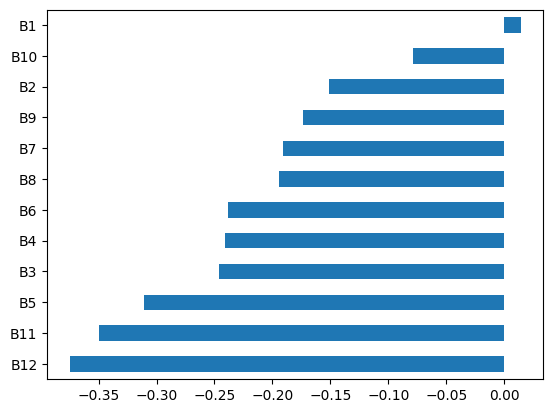

In [ ]:
corr_matrix['biomass'].sort_values()[:-1].plot.barh()

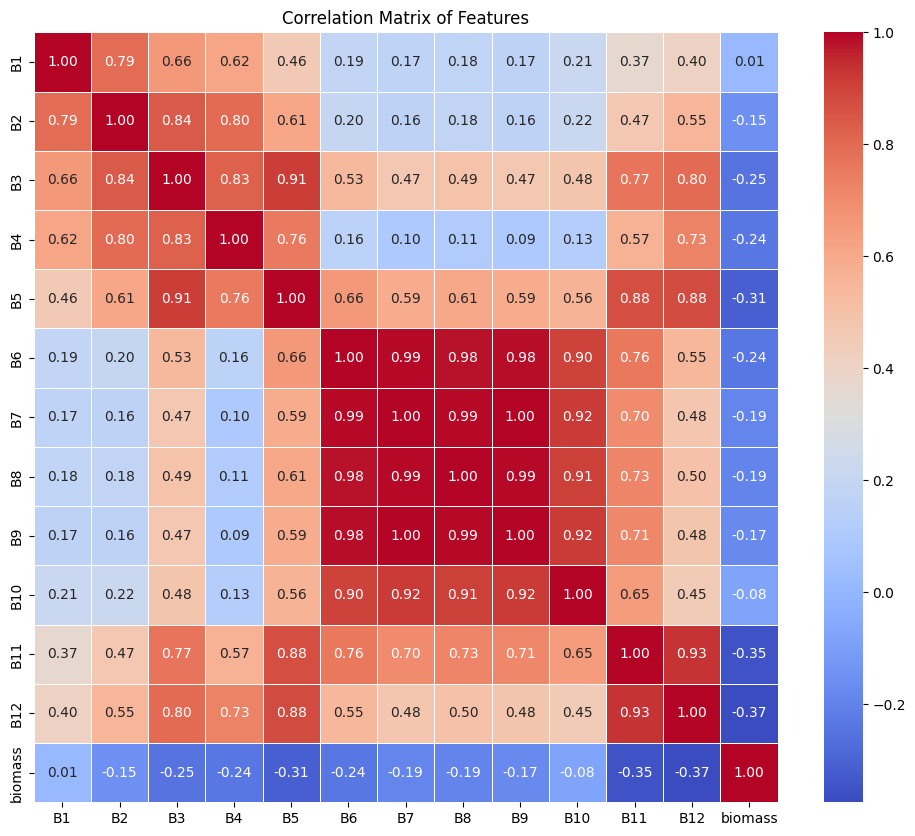

In [ ]:
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Features')
plt.show()


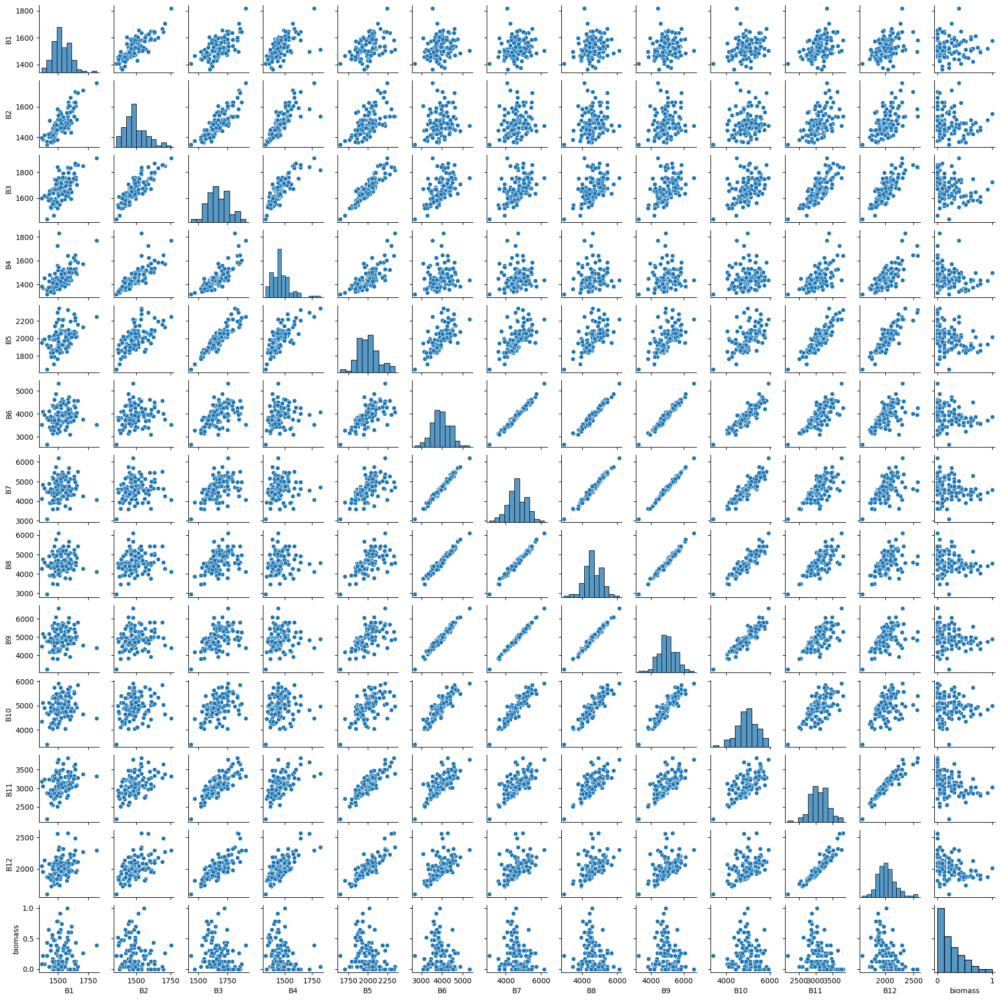

In [ ]:
sns.pairplot(carbon_df,  diag_kind="hist", height=1.5)

In [ ]:
columns = carbon_df.columns.values
columns = list(columns)

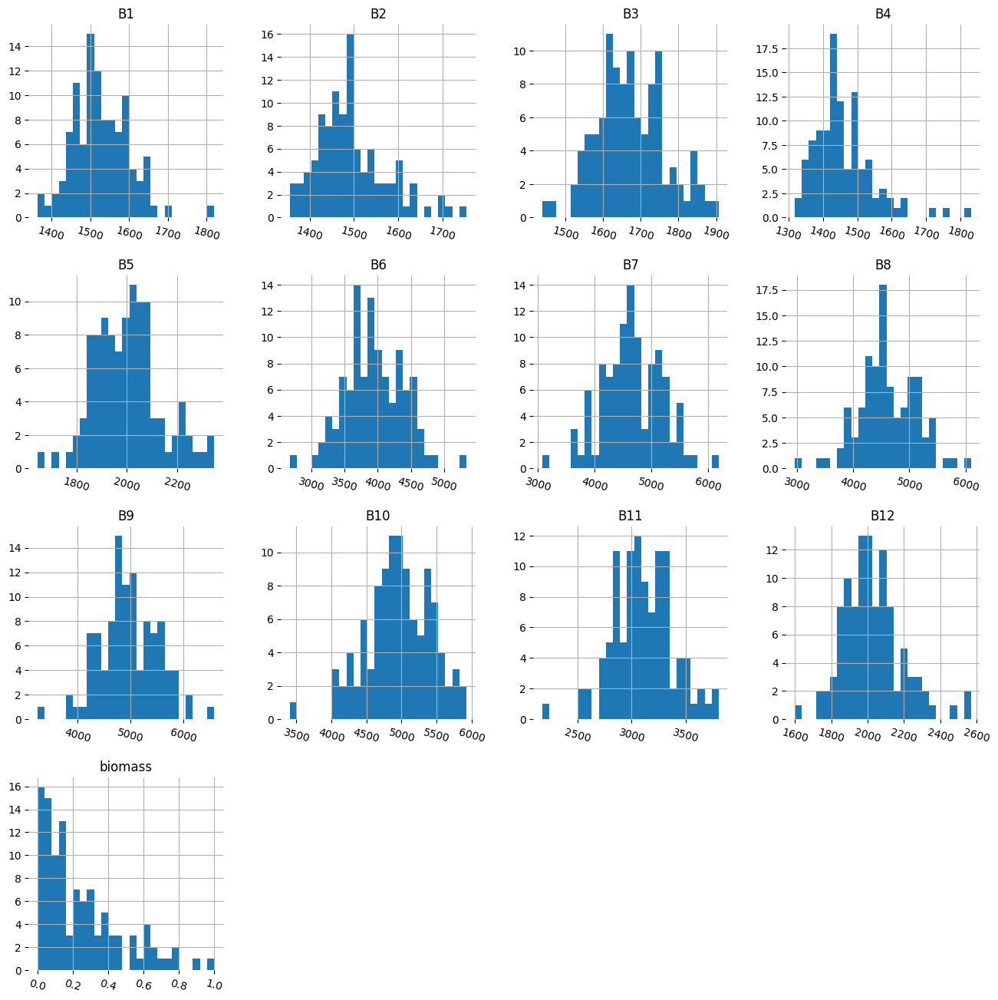

In [ ]:
df=carbon_df[columns]
h = df.hist(bins=25,figsize=(16,16),xlabelsize='10',ylabelsize='10',xrot=-15)
sns.despine(left=True, bottom=True)
[x.title.set_size(12) for x in h.ravel()];
[x.yaxis.tick_left() for x in h.ravel()];

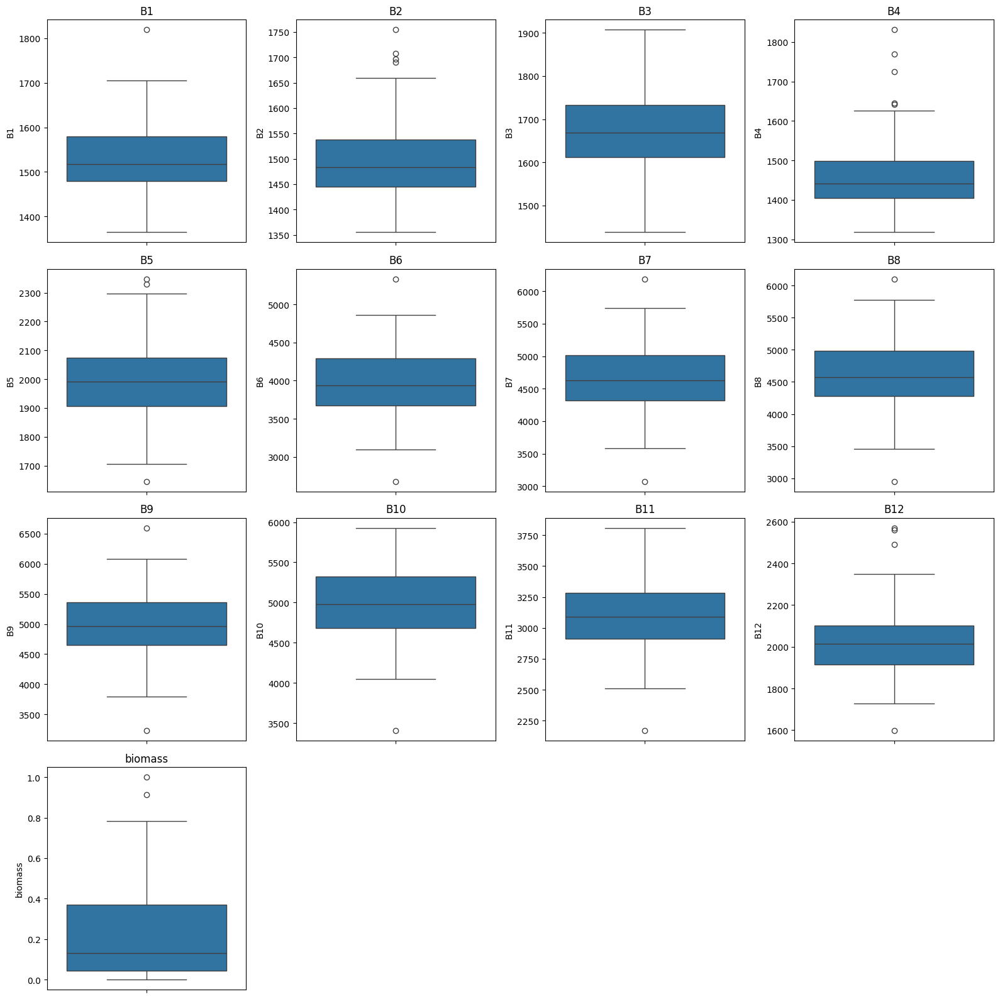

In [ ]:
# Boxplots to check outliers

plt.figure(figsize=(16, 16))
for i, column in enumerate(carbon_df.columns):
    plt.subplot(4, 4, i + 1)
    sns.boxplot(y=carbon_df[column])
    plt.title(column)
plt.tight_layout()
plt.show()


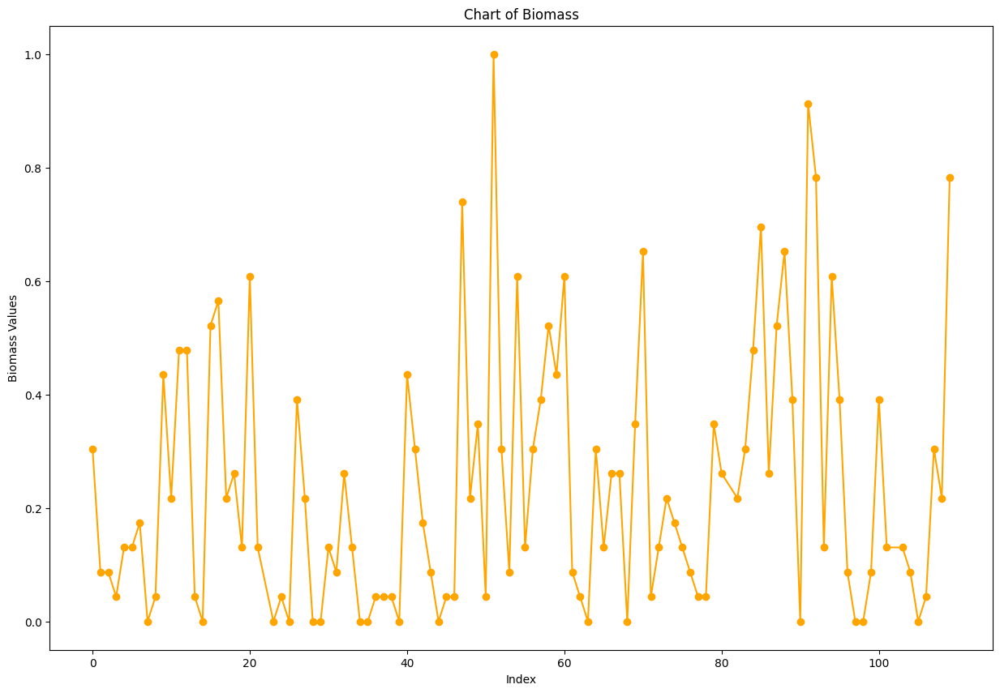

In [ ]:
#  Chart of the biomass values
plt.rcParams["figure.figsize"] = (15, 10)
plt.plot(carbon_df['biomass'], marker='o', linestyle='-', color='orange')
plt.xlabel('Index')
plt.ylabel('Biomass Values')
plt.title('Chart of Biomass')
plt.show()


In [ ]:
df = carbon_df.copy()

In [ ]:
# Enhanced Vegetation Index (EVI)
df['EVI'] = 2.5 * ((df['B8'] - df['B4']) / (df['B8'] + 6 * df['B4'] - 7.5 * df['B2'] + 1))

# Soil Adjusted Vegetation Index (SAVI)
df['SAVI'] = ((df['B8'] - df['B4']) / (df['B8'] + df['B4'] + 0.5)) * 1.5

# Normalized Difference Water Index (NDWI)
df['NDWI'] = (df['B3'] - df['B8']) / (df['B3'] + df['B8'])

# Simple Ratio (SR)
df['SR'] = df['B8'] / df['B4']

# Green Chlorophyll Index (GCI)
df['GCI'] = (df['B8'] / df['B3']) - 1

# Normalized Difference Red Edge (NDRE)
df['NDRE'] = (df['B8'] - df['B5']) / (df['B8'] + df['B5'])

# Normalized Difference Vegetation Index (NDVI)
df['NDVI'] = (df['B8'] - df['B4']) / (df['B8'] + df['B4'])


<Axes: >

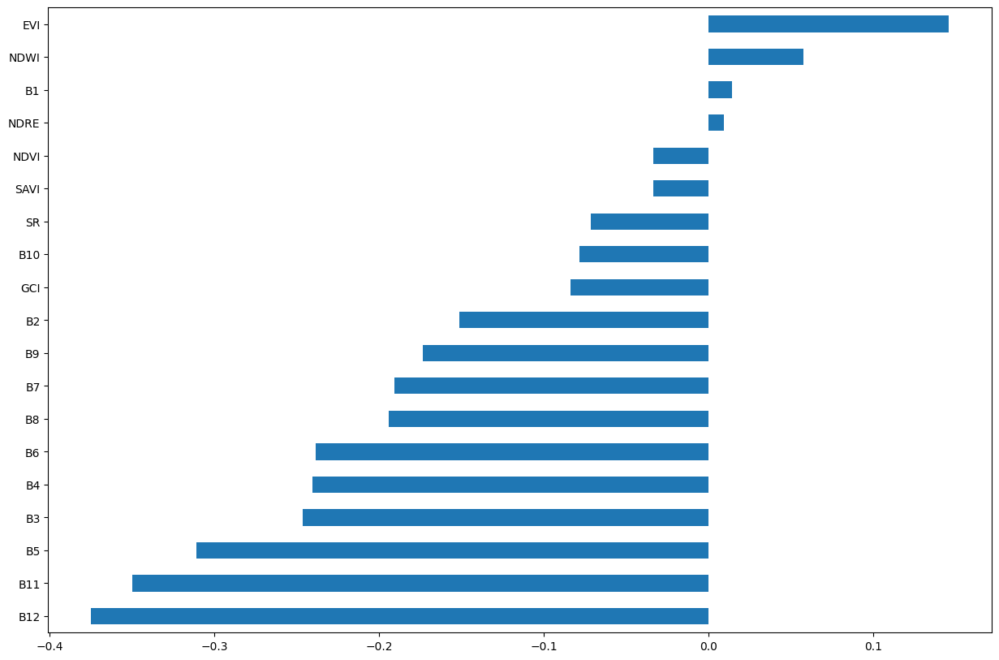

In [ ]:
corr_matrix = df.corr()
corr_matrix['biomass'].sort_values()[:-1].plot.barh()

# **Data Splitting**

In [ ]:
features = df.drop('biomass', axis=1)
target = df['biomass']

In [ ]:
fe_X_train, fe_X_test, fe_y_train, fe_y_test = train_test_split(features, target, test_size=0.1, random_state=42)

In [ ]:
scaler = StandardScaler()
fe_X_train_scaled = scaler.fit_transform(fe_X_train)
fe_X_test_scaled = scaler.transform(fe_X_test)

In [ ]:
# Apply PCA
fe_pca = PCA(n_components=0.95)
fe_X_train_pca = fe_pca.fit_transform(fe_X_train_scaled)
fe_X_test_pca = fe_pca.transform(fe_X_test_scaled)

print(f"Number of principal components: {fe_pca.n_components_}")
print(f"Explained variance ratio: {fe_pca.explained_variance_ratio_}")

Number of principal components: 4
Explained variance ratio: [0.58069724 0.28467038 0.07346731 0.02290973]


In [ ]:
# Split the initial features
X = carbon_df.drop('biomass', axis=1)
y = carbon_df['biomass']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Apply PCA
pca = PCA(n_components=0.95)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

print(f"Number of principal components: {pca.n_components_}")
print(f"Explained variance ratio: {pca.explained_variance_ratio_}")

Number of principal components: 4
Explained variance ratio: [0.65122616 0.23247293 0.06193389 0.02025715]


# **Model**

## **Model Selection**

In [ ]:
lr_reg = LinearRegression()
dt_reg = DecisionTreeRegressor()
rf_reg = RandomForestRegressor()
svr_reg = SVR(kernel='rbf')
etr_reg = ExtraTreesRegressor()
xgb_reg = XGBRegressor()

In [ ]:
def evaluate_model(reg, X_train, X_test, y_train, y_test):
    reg.fit(X_train, y_train)

    y_pred_train = reg.predict(X_train)
    y_pred_test = reg.predict(X_test)

    mse = mean_squared_error(y_test, y_pred_test)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred_test)
    mape = mean_absolute_percentage_error(y_test, y_pred_test)
    r2 = r2_score(y_test, y_pred_test)

    cv_scores = cross_val_score(reg, X_train, y_train, scoring="neg_mean_squared_error", cv=5)

    # Print results
    print(f"\n{reg.__class__.__name__}")
    print(f"R-squared: {r2:.4f}")
    print(f"Mean Squared Error: {mse:.4f}")
    print(f"Root Mean Squared Error: {rmse:.4f}")
    print(f"Mean Absolute Error: {mae:.4f}")
    print(f"Mean Absolute Percentage Error: {mape:.4f}")
    print(f"Cross-validation MSE: {-cv_scores.mean():.4f} (+/- {cv_scores.std() * 2:.4f})")

    return y_pred_train, y_pred_test


In [ ]:

def plot_results(reg, y_true, y_pred_train, y_pred_test):
    plt.figure(figsize=(15, 10))

    y_pred_combined = np.concatenate([y_pred_train, y_pred_test])

    # Create an index array for x-axis
    x = np.arange(len(y_true))

    plt.plot(x, y_true, marker='o', linestyle='-', color='orange', label='Actual')
    plt.plot(x, y_pred_combined[:len(y_true)], marker='o', linestyle='-', color='blue', label='Predicted')

    plt.xlabel('Index')
    plt.ylabel('Biomass Values')
    plt.title(f'{reg.__class__.__name__} Biomass Prediction')
    plt.legend()

    plt.tight_layout()
    plt.show()


LinearRegression
R-squared: 0.3501
Mean Squared Error: 0.0114
Root Mean Squared Error: 0.1066
Mean Absolute Error: 0.0840
Mean Absolute Percentage Error: 1.0945
Cross-validation MSE: 0.0550 (+/- 0.0405)


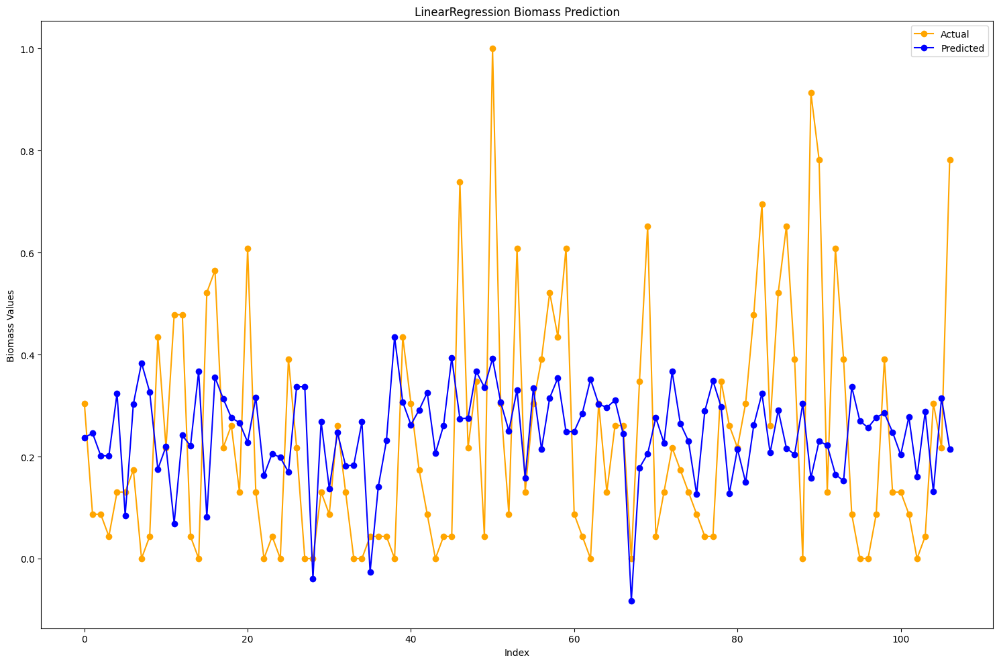


DecisionTreeRegressor
R-squared: -3.7382
Mean Squared Error: 0.0828
Root Mean Squared Error: 0.2878
Mean Absolute Error: 0.2055
Mean Absolute Percentage Error: 1.7486
Cross-validation MSE: 0.1020 (+/- 0.0603)


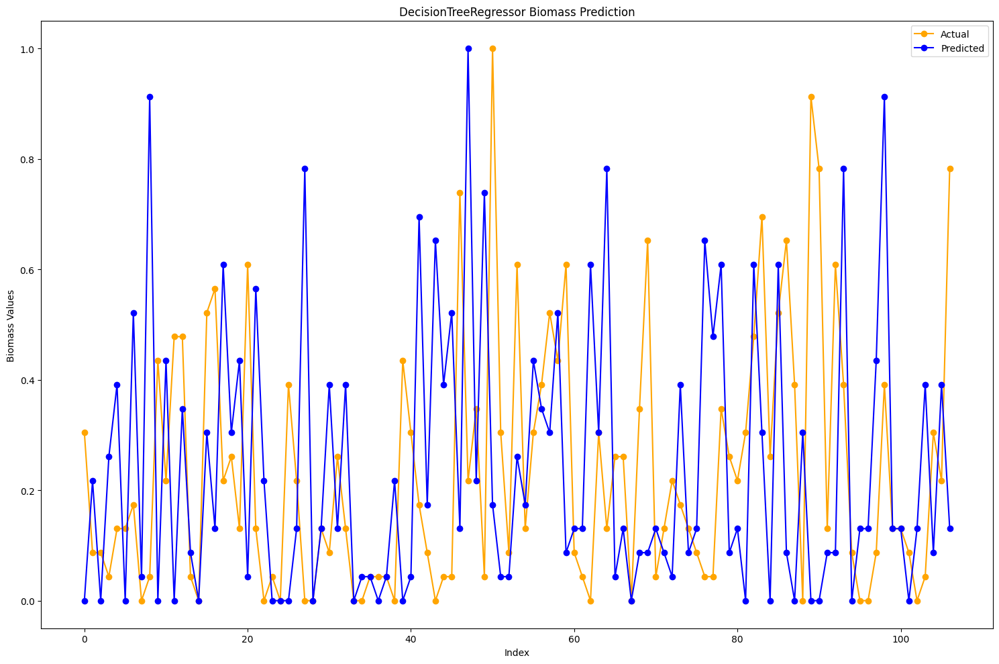


RandomForestRegressor
R-squared: -0.9899
Mean Squared Error: 0.0348
Root Mean Squared Error: 0.1865
Mean Absolute Error: 0.1488
Mean Absolute Percentage Error: 1.6445
Cross-validation MSE: 0.0569 (+/- 0.0432)


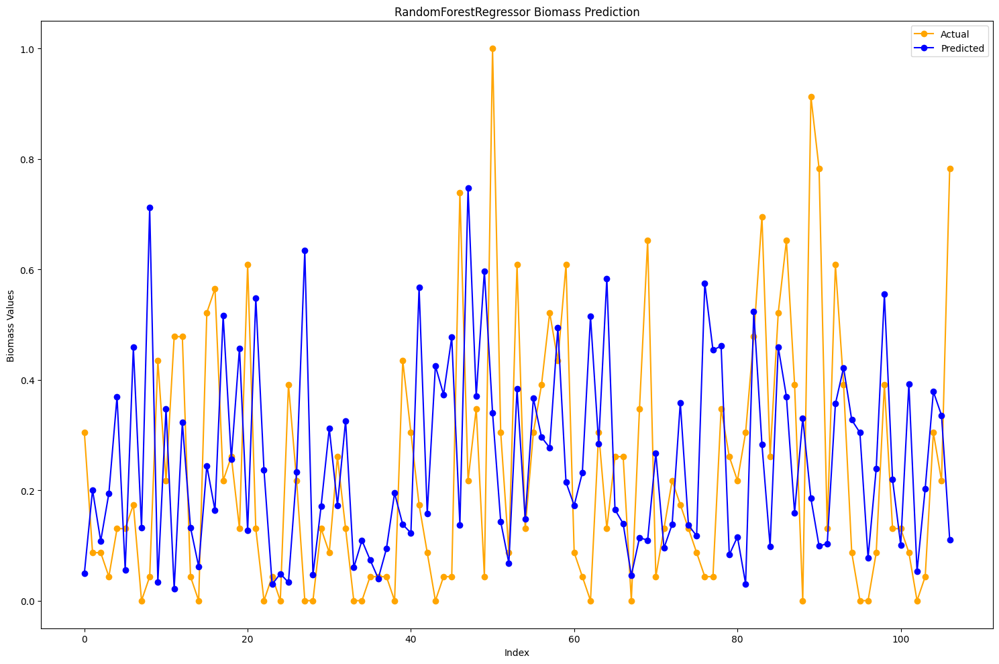


SVR
R-squared: -0.4583
Mean Squared Error: 0.0255
Root Mean Squared Error: 0.1597
Mean Absolute Error: 0.1278
Mean Absolute Percentage Error: 1.3709
Cross-validation MSE: 0.0532 (+/- 0.0567)


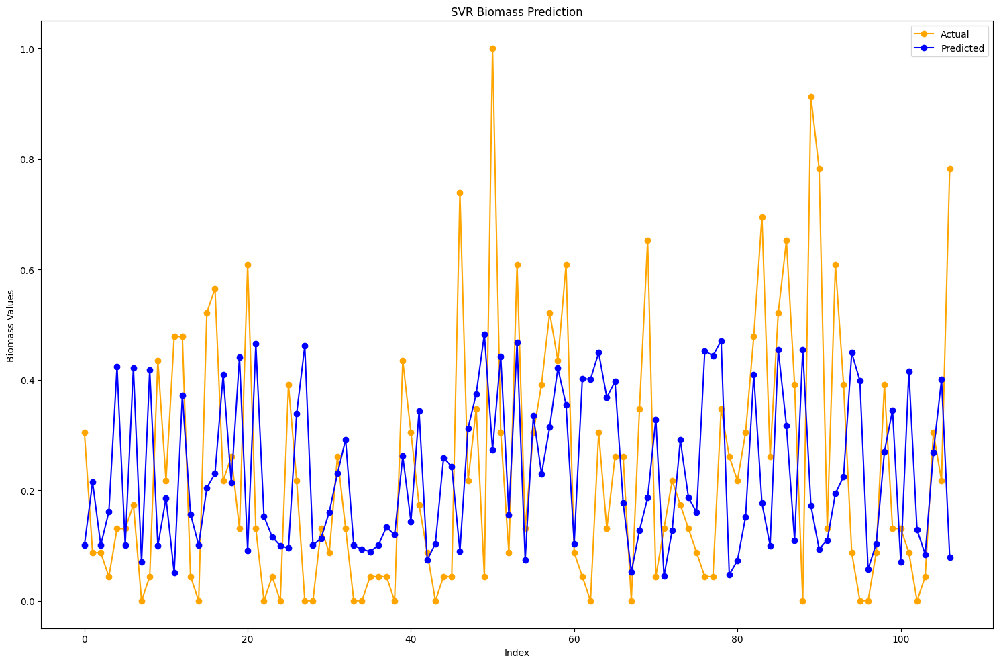


ExtraTreesRegressor
R-squared: -0.9760
Mean Squared Error: 0.0345
Root Mean Squared Error: 0.1859
Mean Absolute Error: 0.1431
Mean Absolute Percentage Error: 1.5839
Cross-validation MSE: 0.0581 (+/- 0.0472)


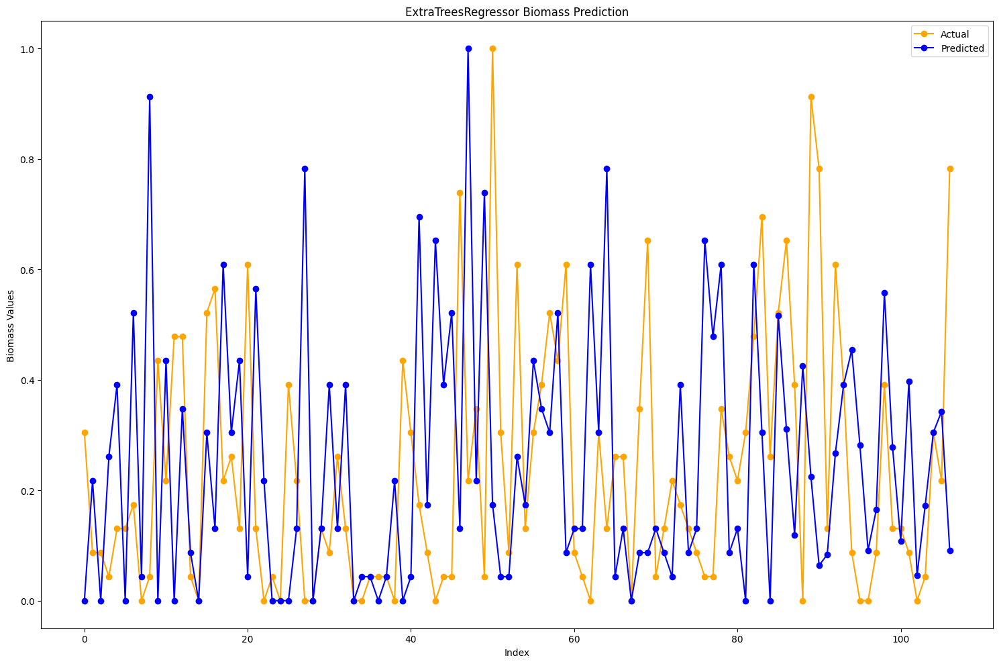


XGBRegressor
R-squared: -1.6405
Mean Squared Error: 0.0462
Root Mean Squared Error: 0.2149
Mean Absolute Error: 0.1600
Mean Absolute Percentage Error: 1.8531
Cross-validation MSE: 0.0655 (+/- 0.0526)


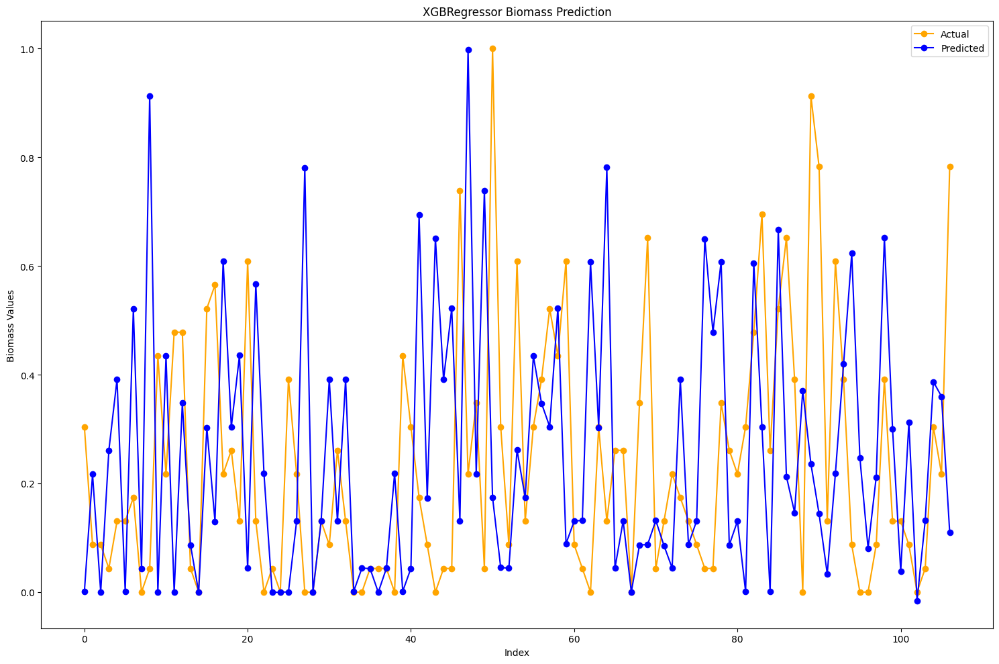

In [ ]:
models = [lr_reg, dt_reg, rf_reg, svr_reg, etr_reg, xgb_reg]

for model in models:
    y_pred_train, y_pred_test = evaluate_model(model, X_train_pca, X_test_pca, y_train, y_test)
    plot_results(model, carbon_df['biomass'], y_pred_train, y_pred_test)


LinearRegression
R-squared: 0.0754
Mean Squared Error: 0.0162
Root Mean Squared Error: 0.1271
Mean Absolute Error: 0.0938
Mean Absolute Percentage Error: 1.0178
Cross-validation MSE: 0.0570 (+/- 0.0239)


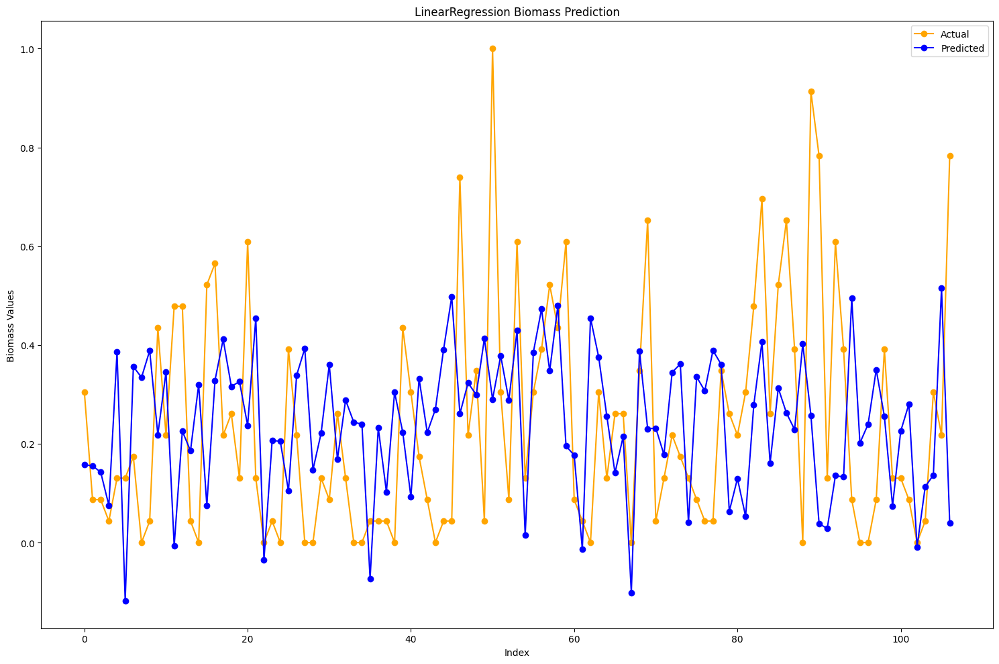


DecisionTreeRegressor
R-squared: -1.1626
Mean Squared Error: 0.0378
Root Mean Squared Error: 0.1944
Mean Absolute Error: 0.1502
Mean Absolute Percentage Error: 1.2680
Cross-validation MSE: 0.0845 (+/- 0.0808)


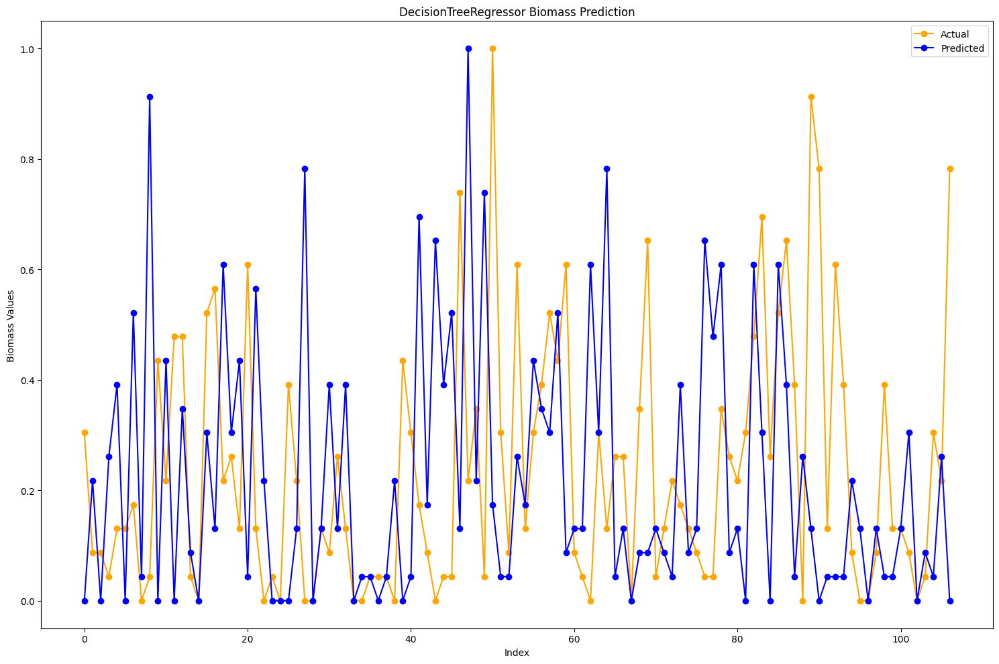


RandomForestRegressor
R-squared: -0.2175
Mean Squared Error: 0.0213
Root Mean Squared Error: 0.1459
Mean Absolute Error: 0.1033
Mean Absolute Percentage Error: 1.2226
Cross-validation MSE: 0.0575 (+/- 0.0526)


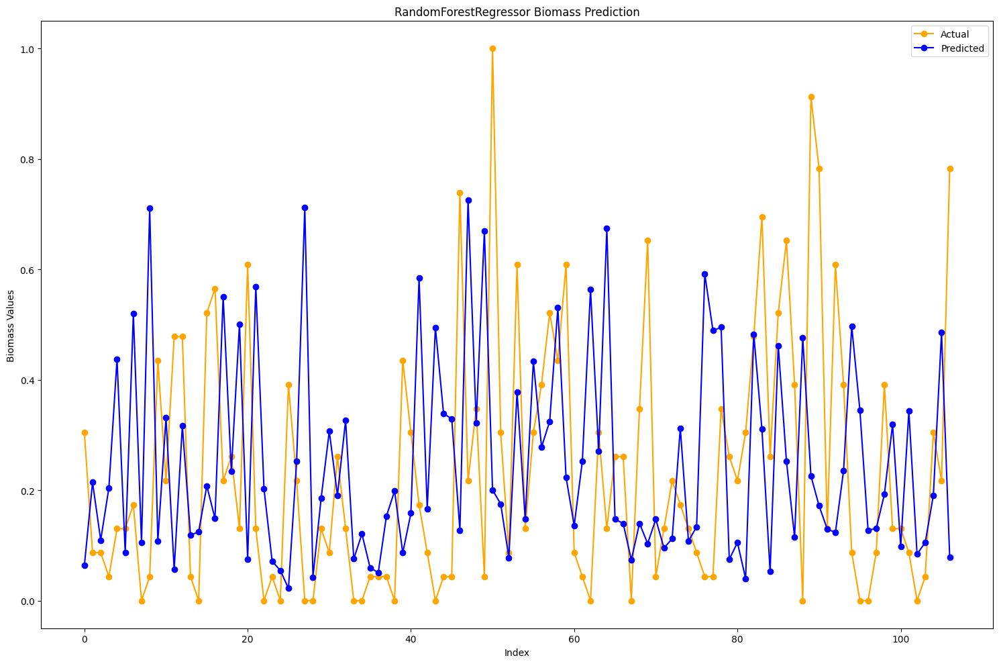


SVR
R-squared: -0.4561
Mean Squared Error: 0.0255
Root Mean Squared Error: 0.1596
Mean Absolute Error: 0.1218
Mean Absolute Percentage Error: 1.2581
Cross-validation MSE: 0.0489 (+/- 0.0413)


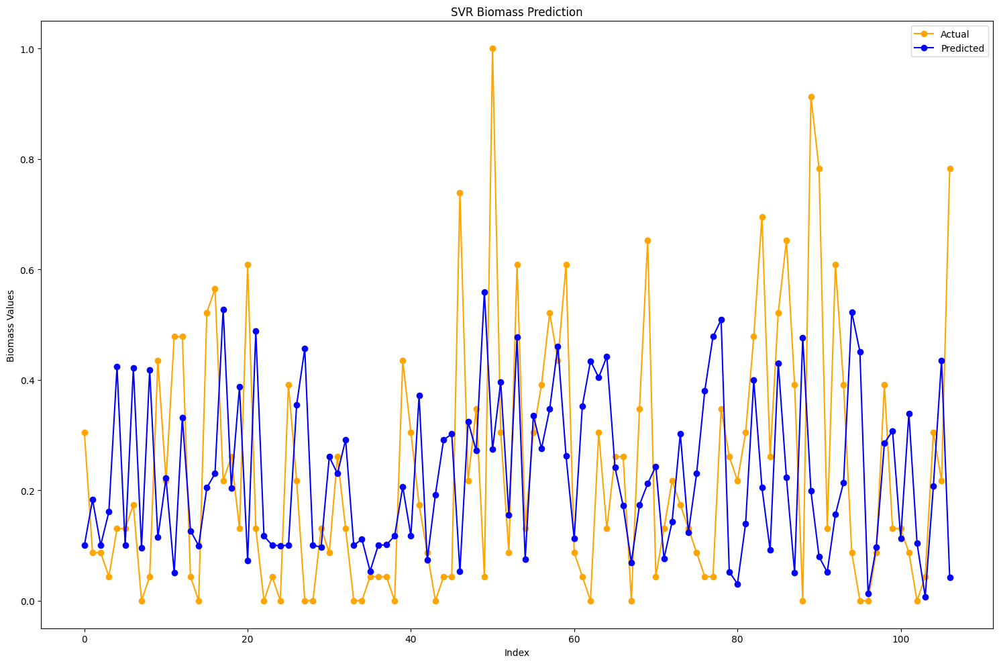


ExtraTreesRegressor
R-squared: -0.3817
Mean Squared Error: 0.0242
Root Mean Squared Error: 0.1554
Mean Absolute Error: 0.1123
Mean Absolute Percentage Error: 1.1831
Cross-validation MSE: 0.0548 (+/- 0.0561)


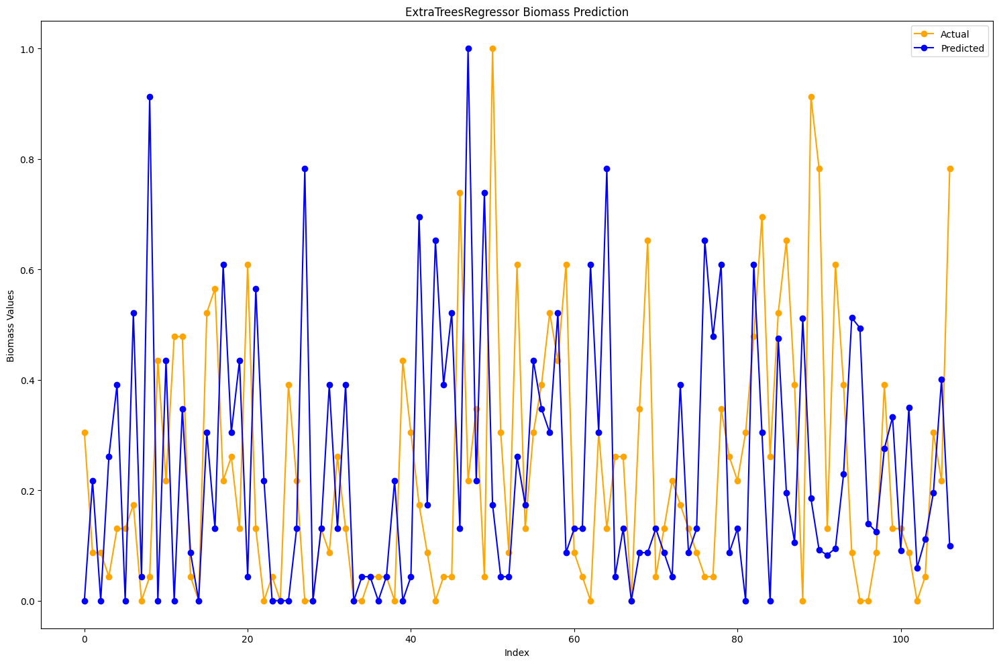


XGBRegressor
R-squared: -1.3733
Mean Squared Error: 0.0415
Root Mean Squared Error: 0.2037
Mean Absolute Error: 0.1440
Mean Absolute Percentage Error: 1.4300
Cross-validation MSE: 0.0664 (+/- 0.0575)


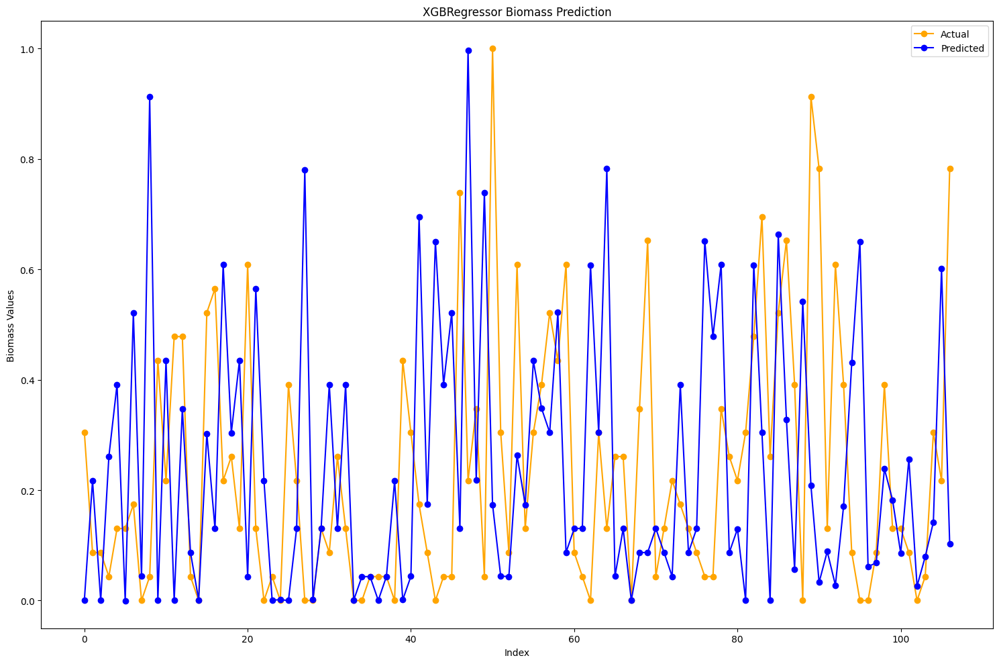

In [ ]:
for model in models:
    y_pred_train, y_pred_test = evaluate_model(model, X_train_scaled, X_test_scaled, y_train, y_test)
    plot_results(model, carbon_df['biomass'], y_pred_train, y_pred_test)


LinearRegression
R-squared: -0.3314
Mean Squared Error: 0.0245
Root Mean Squared Error: 0.1564
Mean Absolute Error: 0.1373
Mean Absolute Percentage Error: 1.8307
Cross-validation MSE: 0.0570 (+/- 0.0281)


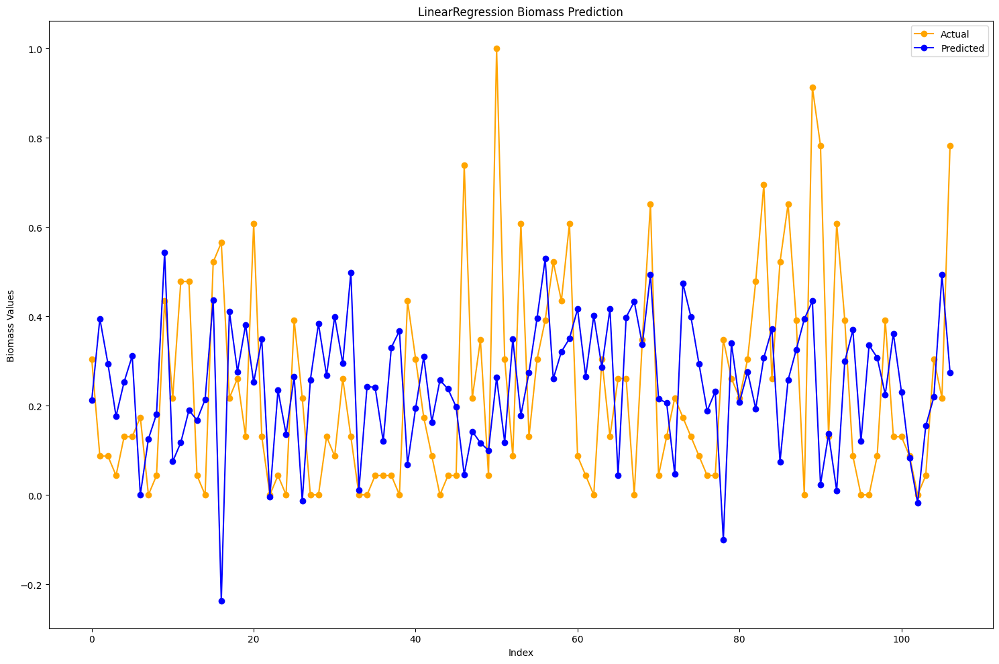


DecisionTreeRegressor
R-squared: -1.5349
Mean Squared Error: 0.0466
Root Mean Squared Error: 0.2158
Mean Absolute Error: 0.1462
Mean Absolute Percentage Error: 1.7700
Cross-validation MSE: 0.0678 (+/- 0.0272)


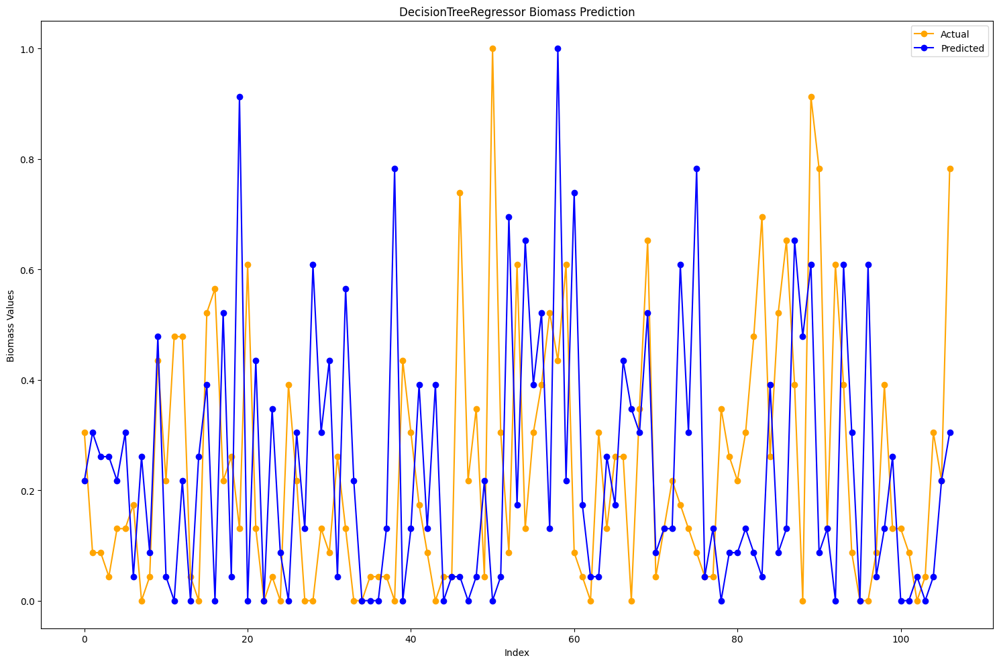


RandomForestRegressor
R-squared: -0.8111
Mean Squared Error: 0.0333
Root Mean Squared Error: 0.1824
Mean Absolute Error: 0.1260
Mean Absolute Percentage Error: 1.7885
Cross-validation MSE: 0.0511 (+/- 0.0444)


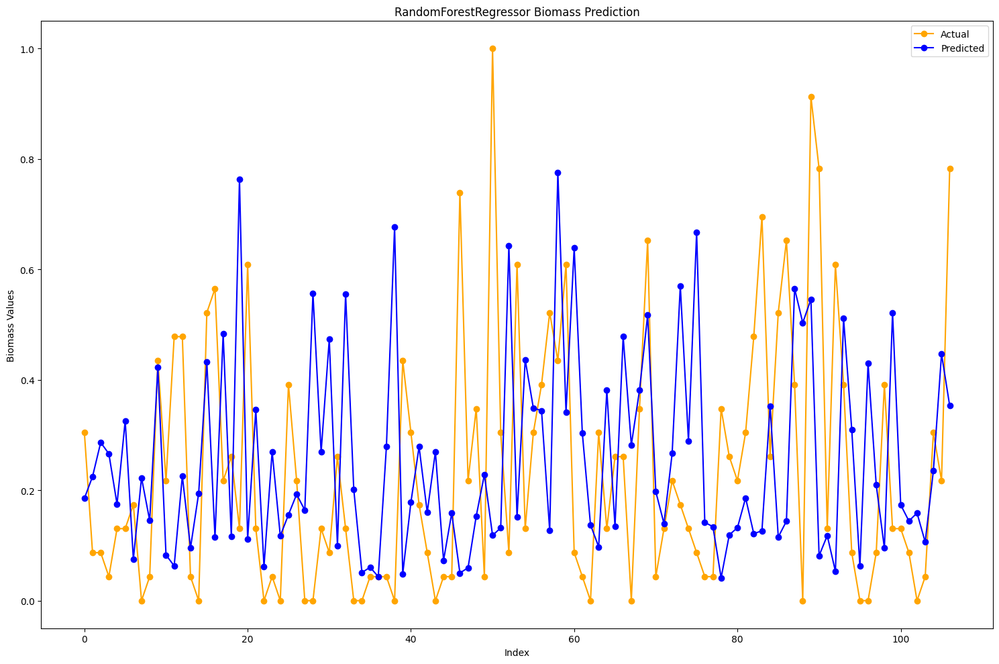


SVR
R-squared: -1.3466
Mean Squared Error: 0.0431
Root Mean Squared Error: 0.2076
Mean Absolute Error: 0.1506
Mean Absolute Percentage Error: 1.9144
Cross-validation MSE: 0.0448 (+/- 0.0475)


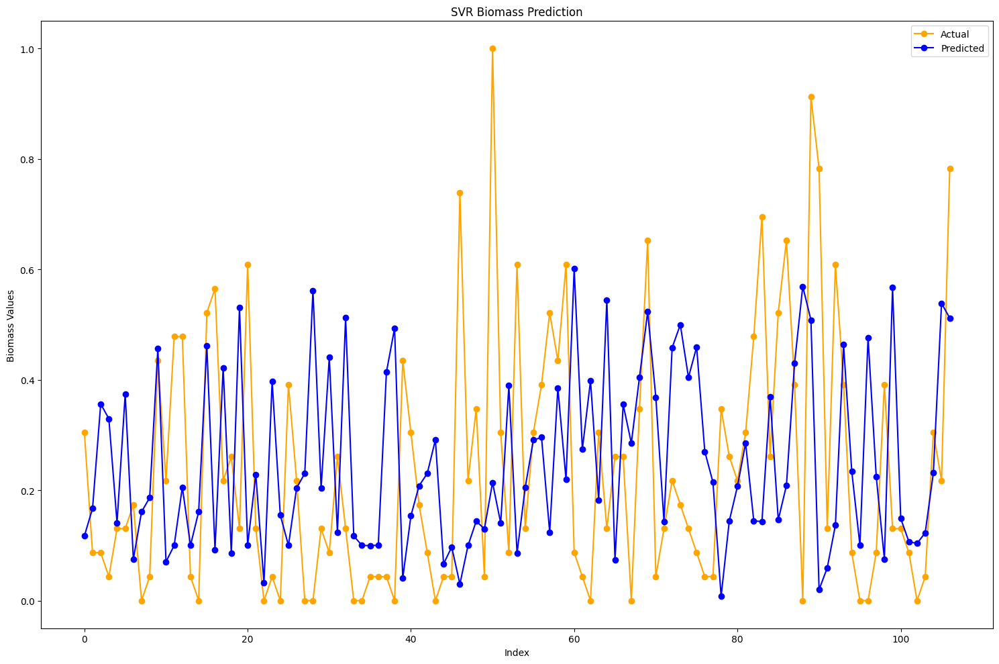


ExtraTreesRegressor
R-squared: -1.3694
Mean Squared Error: 0.0435
Root Mean Squared Error: 0.2086
Mean Absolute Error: 0.1514
Mean Absolute Percentage Error: 2.1109
Cross-validation MSE: 0.0482 (+/- 0.0454)


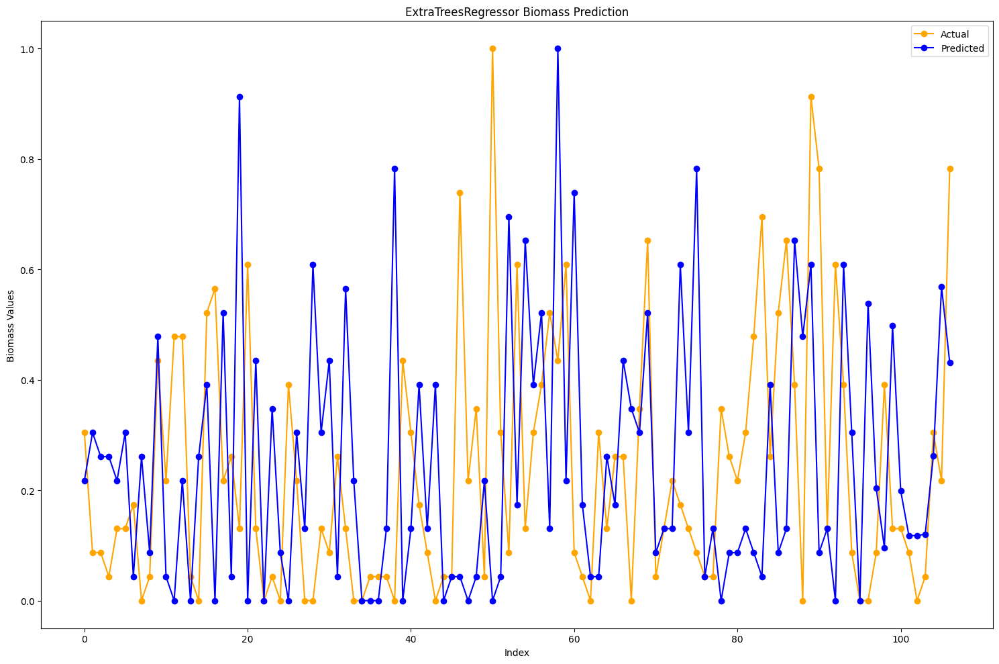


XGBRegressor
R-squared: -2.1761
Mean Squared Error: 0.0584
Root Mean Squared Error: 0.2416
Mean Absolute Error: 0.1777
Mean Absolute Percentage Error: 2.3280
Cross-validation MSE: 0.0608 (+/- 0.0332)


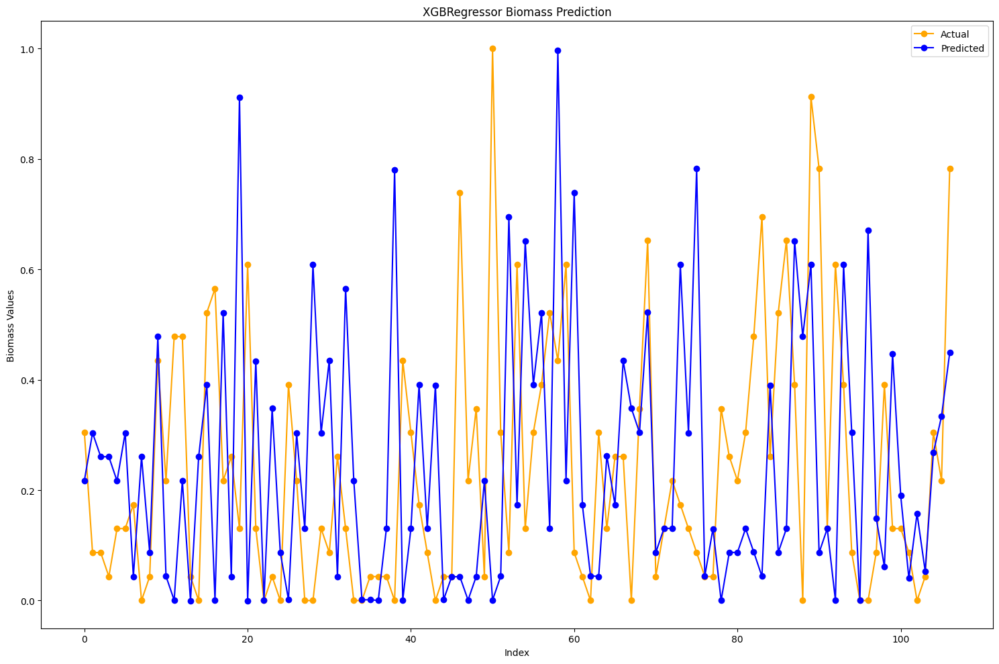

In [ ]:
for model in models:
    y_pred_train, y_pred_test = evaluate_model(model, fe_X_train_scaled, fe_X_test_scaled, fe_y_train, fe_y_test)
    plot_results(model, carbon_df['biomass'], y_pred_train, y_pred_test)


LinearRegression
R-squared: 0.1892
Mean Squared Error: 0.0149
Root Mean Squared Error: 0.1221
Mean Absolute Error: 0.1051
Mean Absolute Percentage Error: 1.3803
Cross-validation MSE: 0.0494 (+/- 0.0282)


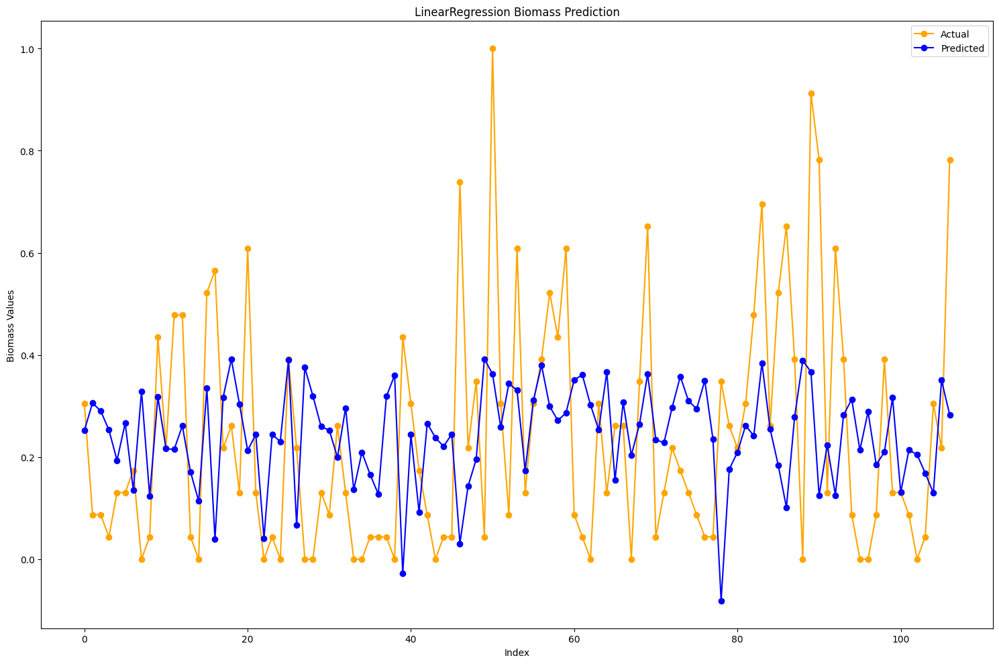


DecisionTreeRegressor
R-squared: -4.3129
Mean Squared Error: 0.0976
Root Mean Squared Error: 0.3124
Mean Absolute Error: 0.2292
Mean Absolute Percentage Error: 2.5548
Cross-validation MSE: 0.1051 (+/- 0.0796)


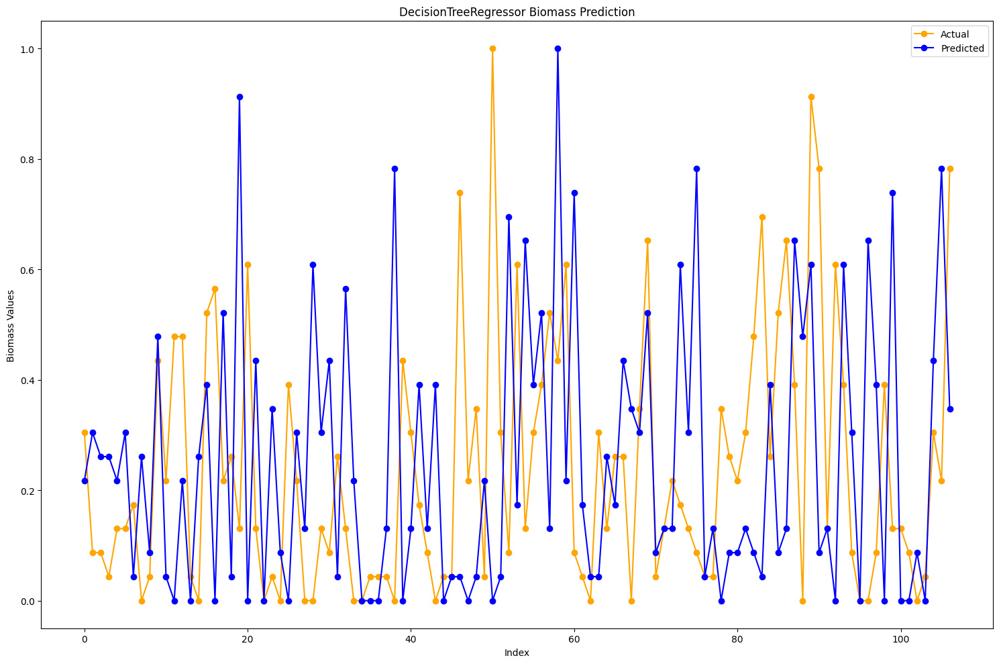


RandomForestRegressor
R-squared: -1.3407
Mean Squared Error: 0.0430
Root Mean Squared Error: 0.2074
Mean Absolute Error: 0.1585
Mean Absolute Percentage Error: 2.0480
Cross-validation MSE: 0.0506 (+/- 0.0509)


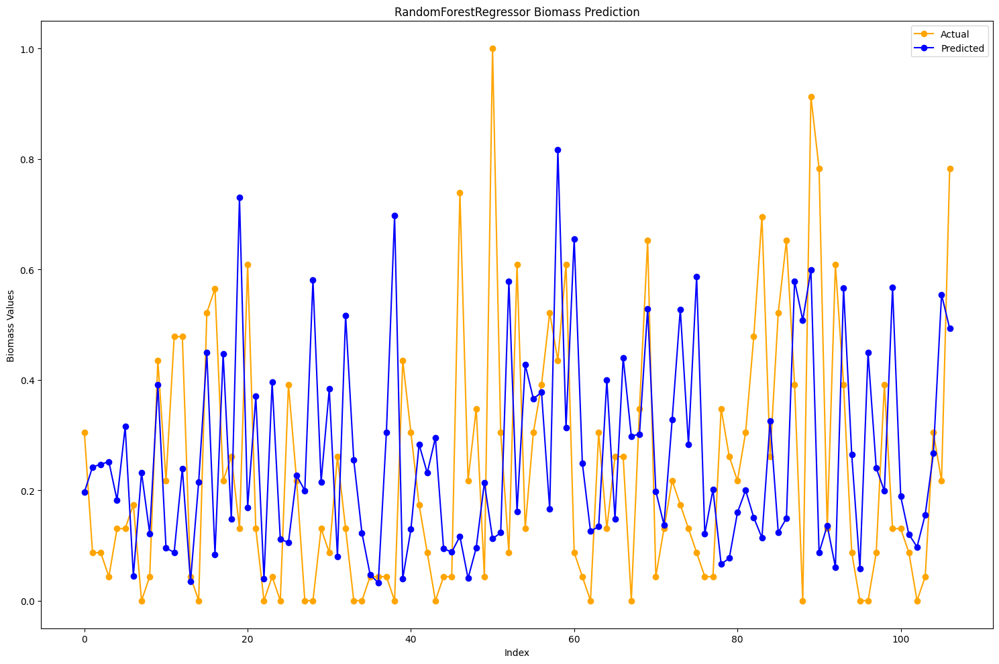


SVR
R-squared: -0.8985
Mean Squared Error: 0.0349
Root Mean Squared Error: 0.1868
Mean Absolute Error: 0.1336
Mean Absolute Percentage Error: 1.8097
Cross-validation MSE: 0.0430 (+/- 0.0484)


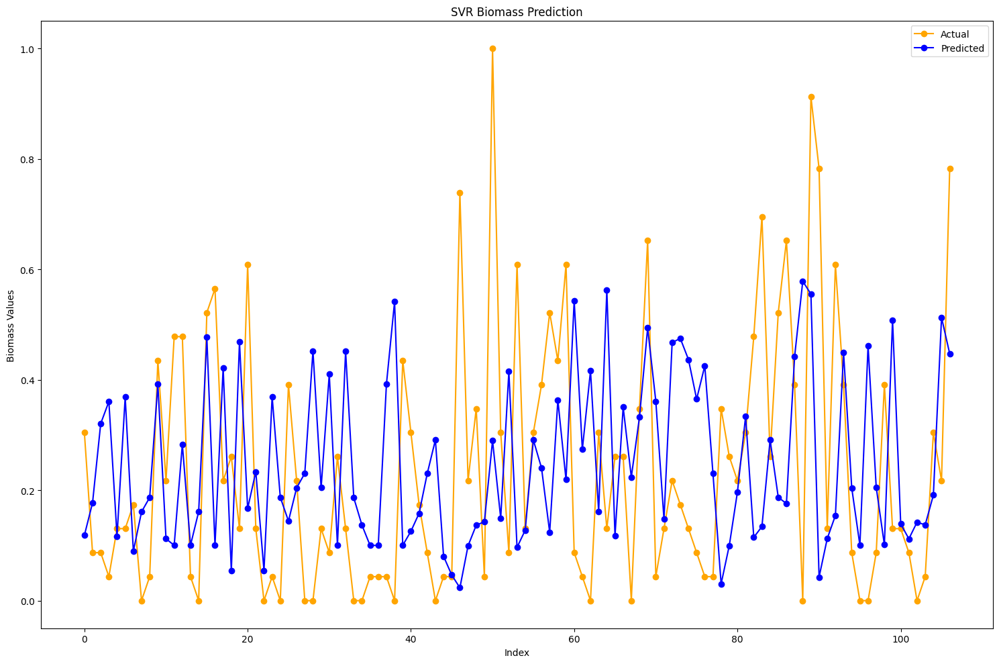


ExtraTreesRegressor
R-squared: -1.2120
Mean Squared Error: 0.0406
Root Mean Squared Error: 0.2016
Mean Absolute Error: 0.1553
Mean Absolute Percentage Error: 2.0413
Cross-validation MSE: 0.0471 (+/- 0.0409)


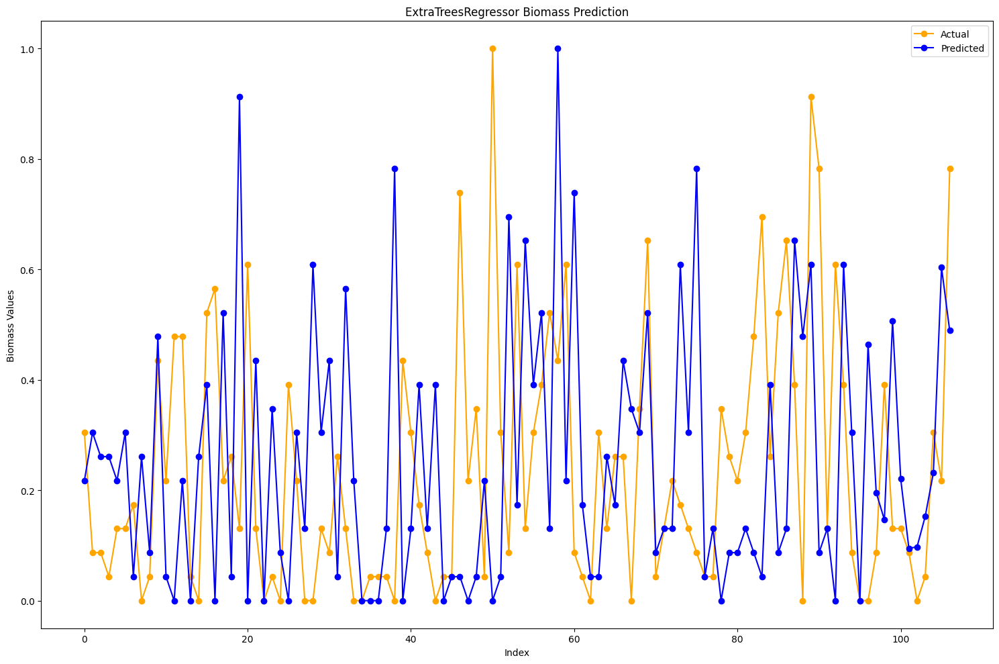


XGBRegressor
R-squared: -1.8163
Mean Squared Error: 0.0517
Root Mean Squared Error: 0.2275
Mean Absolute Error: 0.1824
Mean Absolute Percentage Error: 2.0604
Cross-validation MSE: 0.0686 (+/- 0.0896)


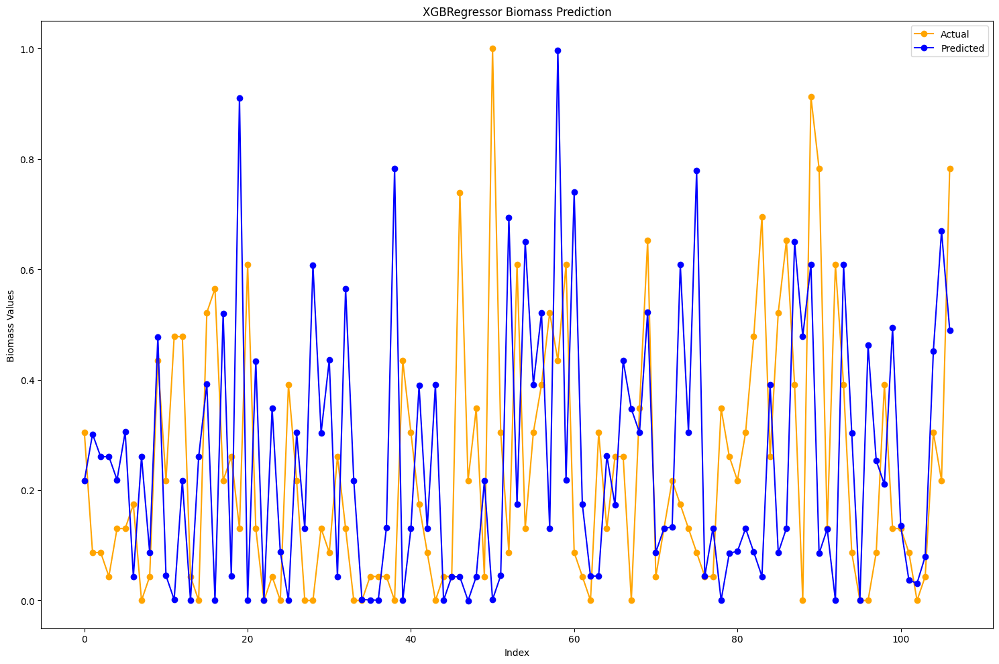

In [ ]:
for model in models:
    y_pred_train, y_pred_test = evaluate_model(model, fe_X_train_pca, fe_X_test_pca, fe_y_train, fe_y_test)
    plot_results(model, carbon_df['biomass'], y_pred_train, y_pred_test)

In [ ]:
models = {
    'lr': (LinearRegression(), {}),
    'lasso': (Lasso(), {'alpha': np.logspace(-4, 1, 50)}),
    'ridge': (Ridge(), {'alpha': np.logspace(-4, 1, 50)}),
    'elastic': (ElasticNet(), {'alpha': np.logspace(-4, 1, 50), 'l1_ratio': np.linspace(0.1, 0.9, 9)}),
    'dt': (DecisionTreeRegressor(), {'max_depth': [3, 5, 7, 9, 11], 'min_samples_split': [2, 5, 10]}),
    'rf': (RandomForestRegressor(), {'n_estimators': [100, 200, 300], 'max_depth': [5, 10, 15, None]}),
    'svr': (SVR(), {'C': np.logspace(-3, 2, 6), 'gamma': np.logspace(-3, 2, 6)}),
    'xgb': (XGBRegressor(), {'n_estimators': [100, 200, 300], 'max_depth': [3, 5, 7], 'learning_rate': [0.01, 0.1, 0.3]})
}


Scaled Initial features
lr R2 Score: 0.0754
lr MSE: 0.0162
lr RMSE: 0.1271
lr MAE: 0.0938


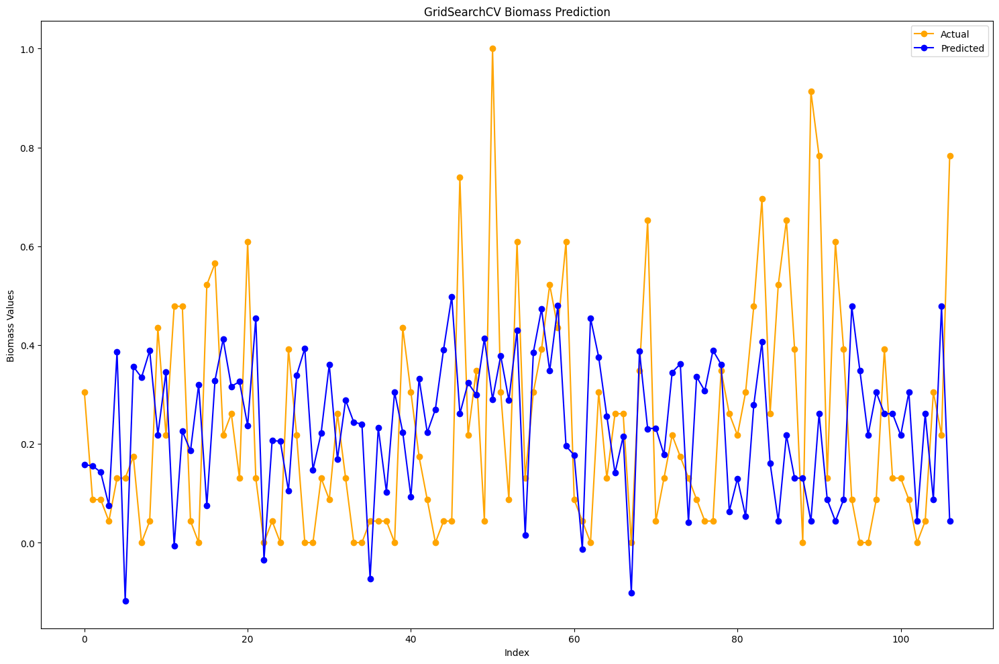

lasso R2 Score: 0.4649
lasso MSE: 0.0094
lasso RMSE: 0.0967
lasso MAE: 0.0696


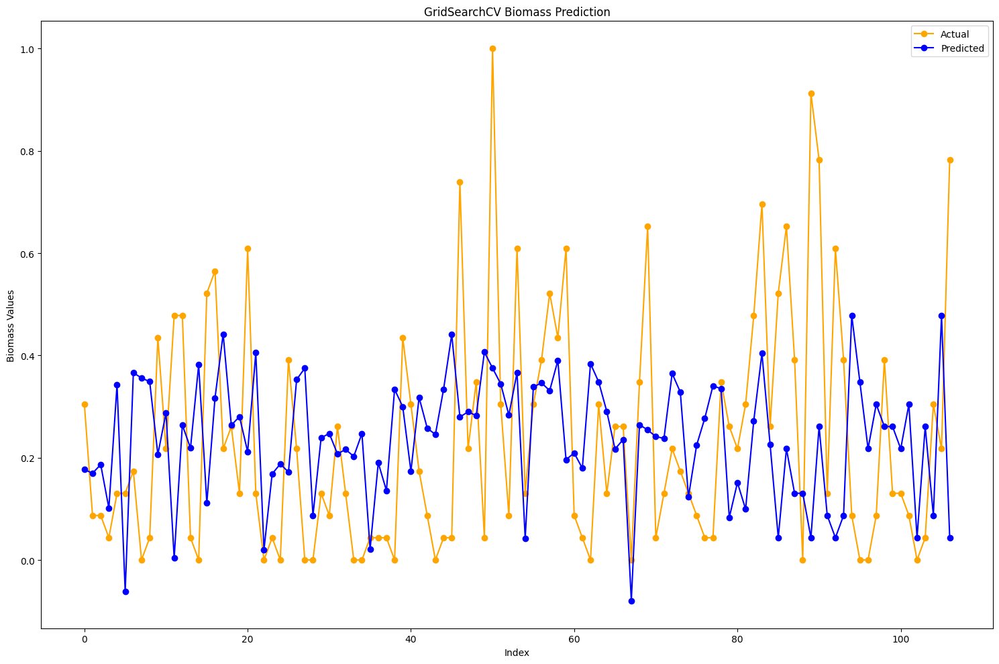

ridge R2 Score: 0.5039
ridge MSE: 0.0087
ridge RMSE: 0.0931
ridge MAE: 0.0670


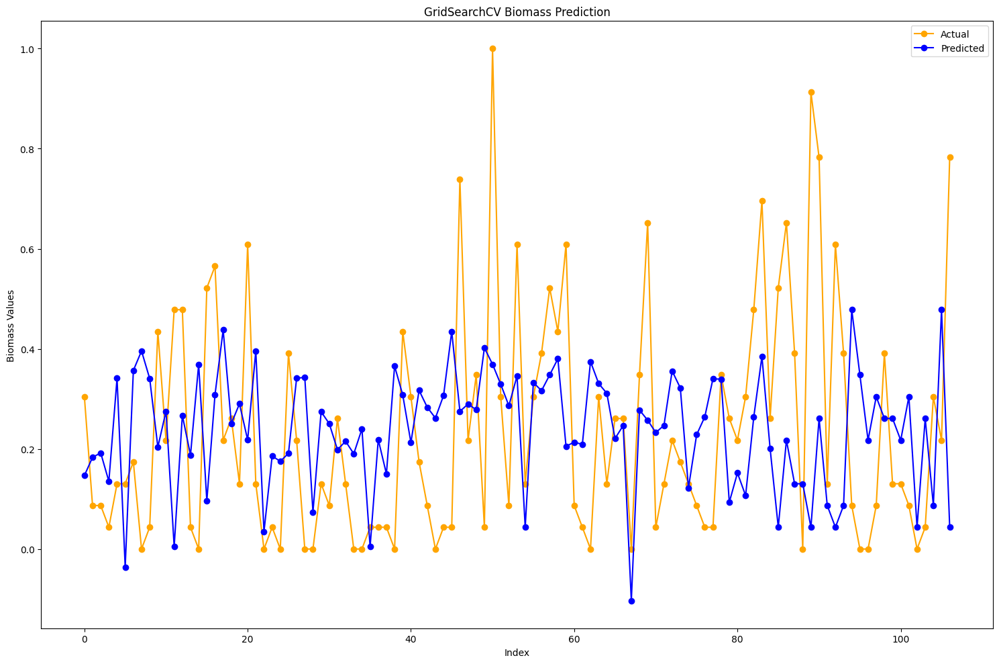

elastic R2 Score: 0.4806
elastic MSE: 0.0091
elastic RMSE: 0.0953
elastic MAE: 0.0681


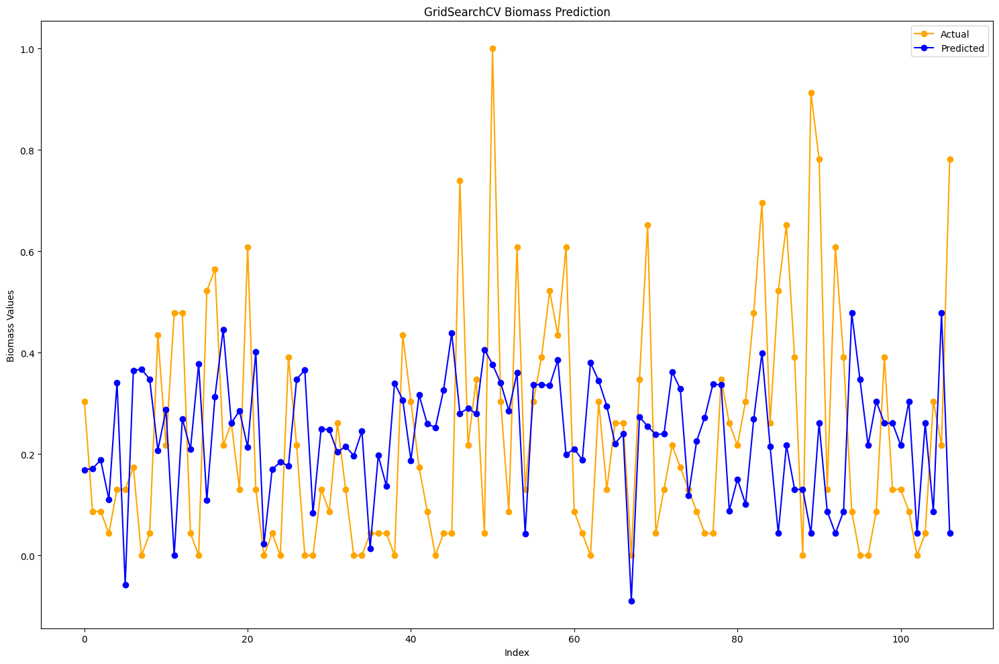

dt R2 Score: -0.8777
dt MSE: 0.0328
dt RMSE: 0.1812
dt MAE: 0.1249


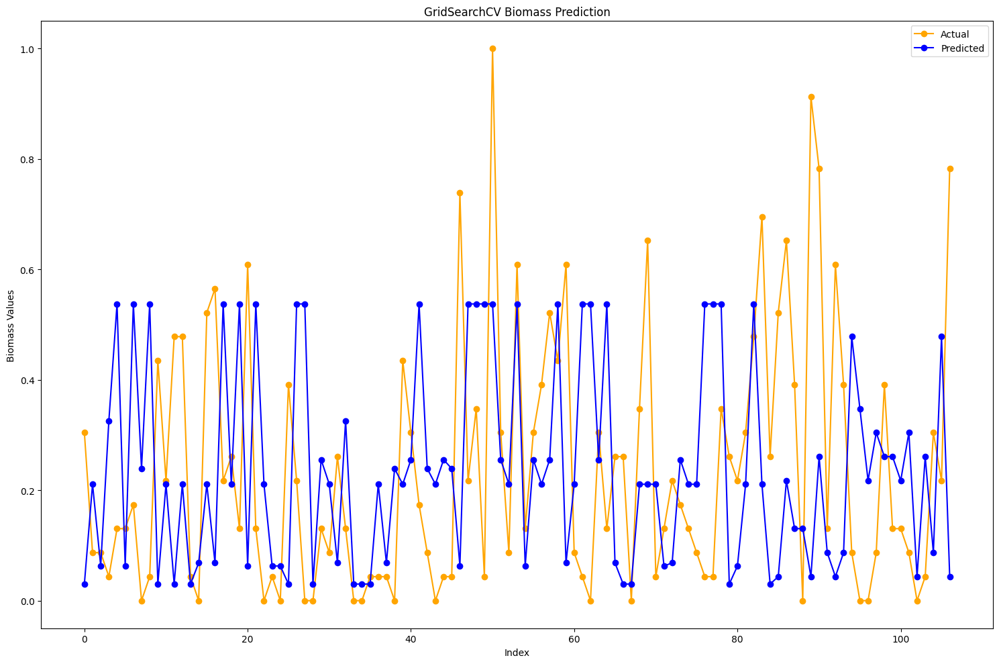

rf R2 Score: -0.1925
rf MSE: 0.0208
rf RMSE: 0.1444
rf MAE: 0.0982


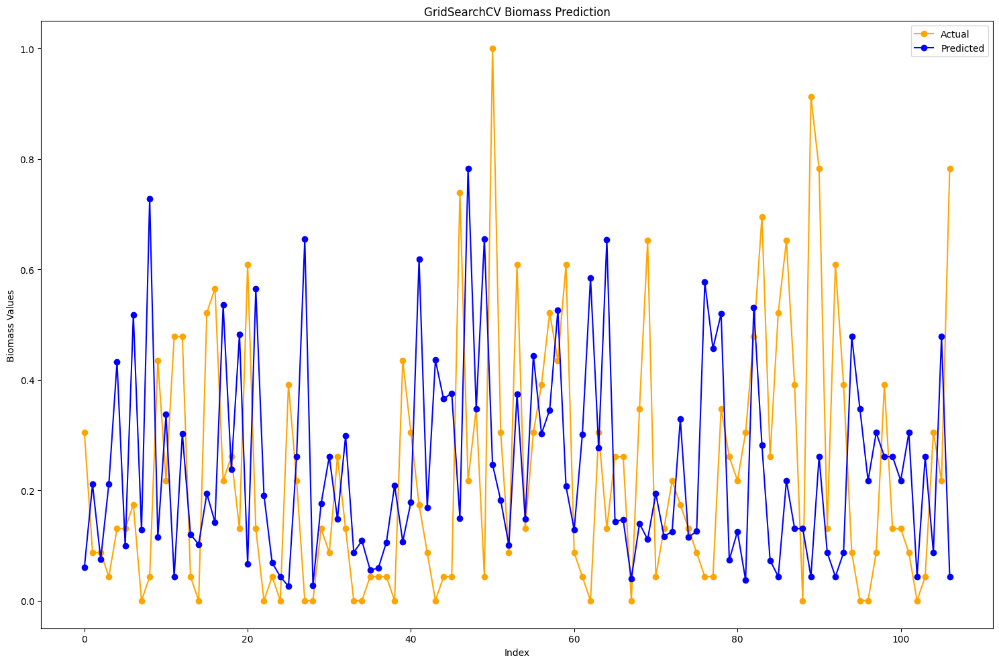

svr R2 Score: 0.0529
svr MSE: 0.0166
svr RMSE: 0.1287
svr MAE: 0.0992


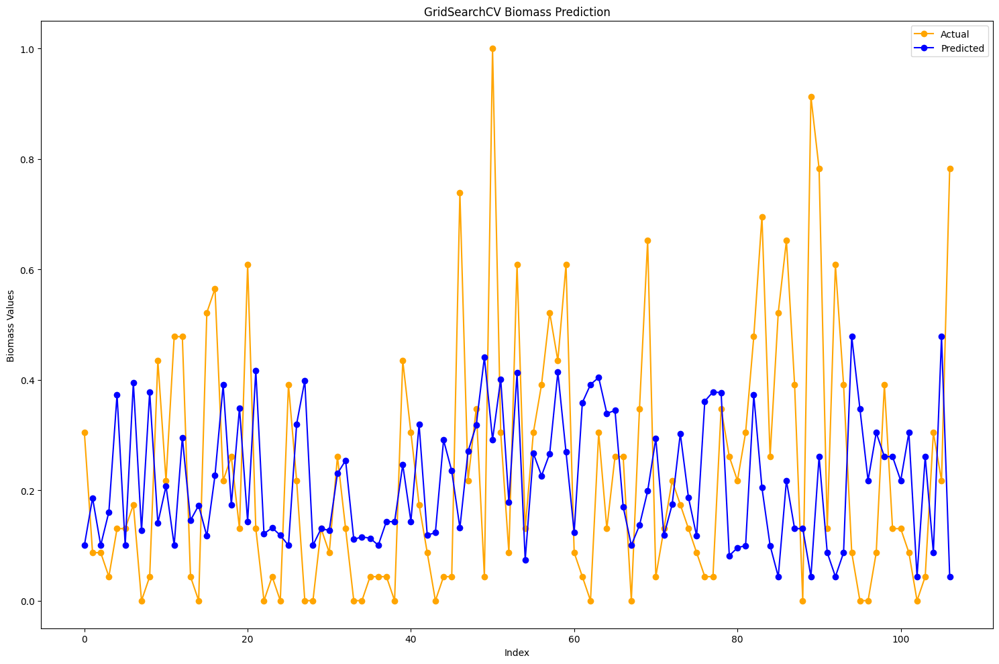

xgb R2 Score: -0.0251
xgb MSE: 0.0179
xgb RMSE: 0.1339
xgb MAE: 0.1015


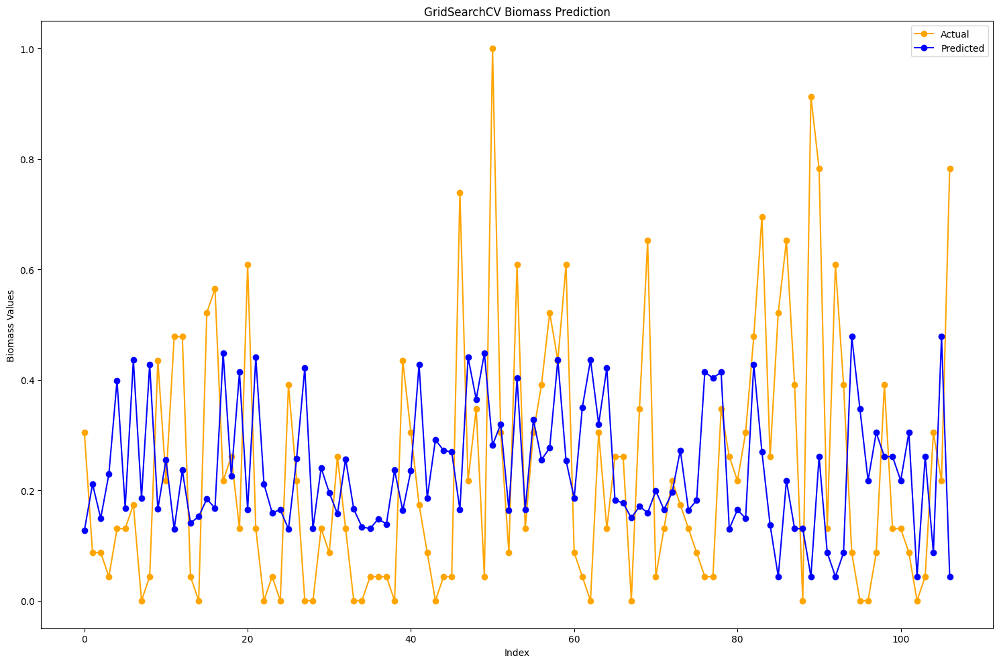

In [ ]:
print('Scaled Initial features')
best_models = {}
for name, (model, param_grid) in models.items():
    rs = GridSearchCV(model, param_grid, cv=5, n_jobs=-1)
    rs.fit(X_train_scaled, y_train)
    best_models[name] = rs.best_estimator_
    y_pred = rs.predict(X_test_scaled)
    print(f"{name} R2 Score: {r2_score(y_test, y_pred):.4f}")
    print(f"{name} MSE: {mean_squared_error(y_test, y_pred):.4f}")
    print(f"{name} RMSE: {np.sqrt(mean_squared_error(y_test, y_pred)):.4f}")
    print(f"{name} MAE: {mean_absolute_error(y_test, y_pred):.4f}")
    plot_results(rs, carbon_df['biomass'], rs.predict(X_train_scaled), y_test)
    # Save model
    joblib.dump(rs.best_estimator_, f'scaled_initial_{name}_model.pkl')

PCA on Initial features
lr R2 Score: 0.3501
lr R2 Score: 0.3501
lr MSE: 0.0114
lr RMSE: 0.1066
lr MAE: 0.0840


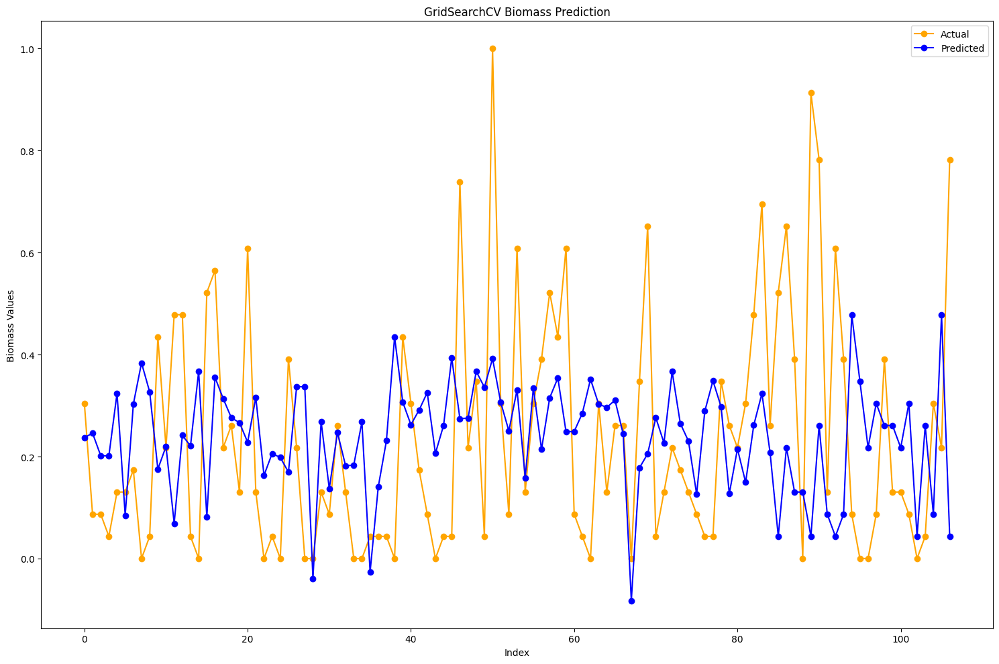

lasso R2 Score: 0.3135
lasso R2 Score: 0.3135
lasso MSE: 0.0120
lasso RMSE: 0.1096
lasso MAE: 0.0861


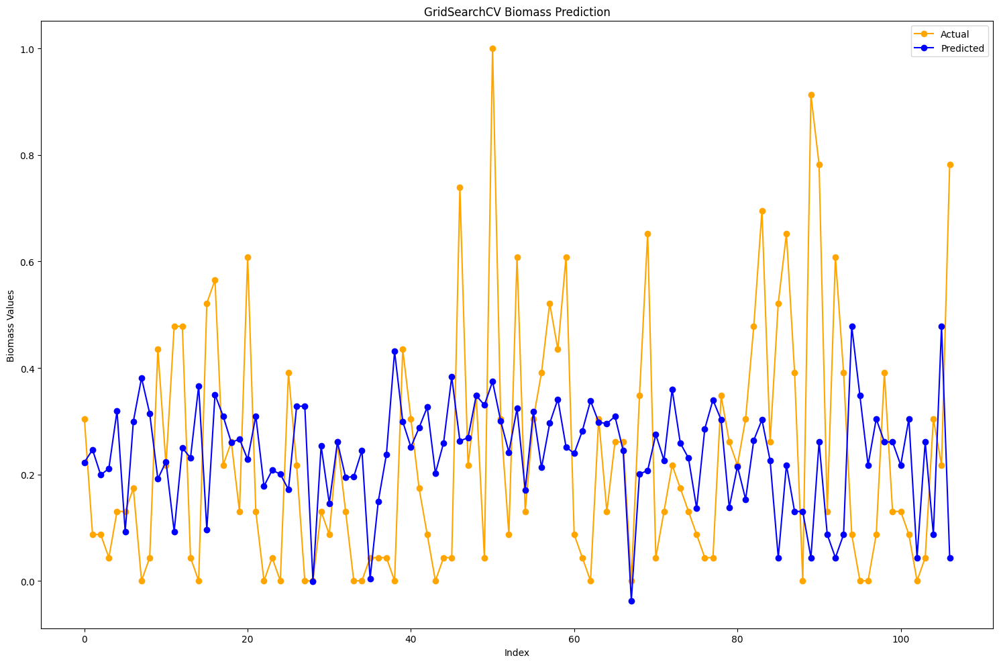

ridge R2 Score: 0.3077
ridge R2 Score: 0.3077
ridge MSE: 0.0121
ridge RMSE: 0.1100
ridge MAE: 0.0872


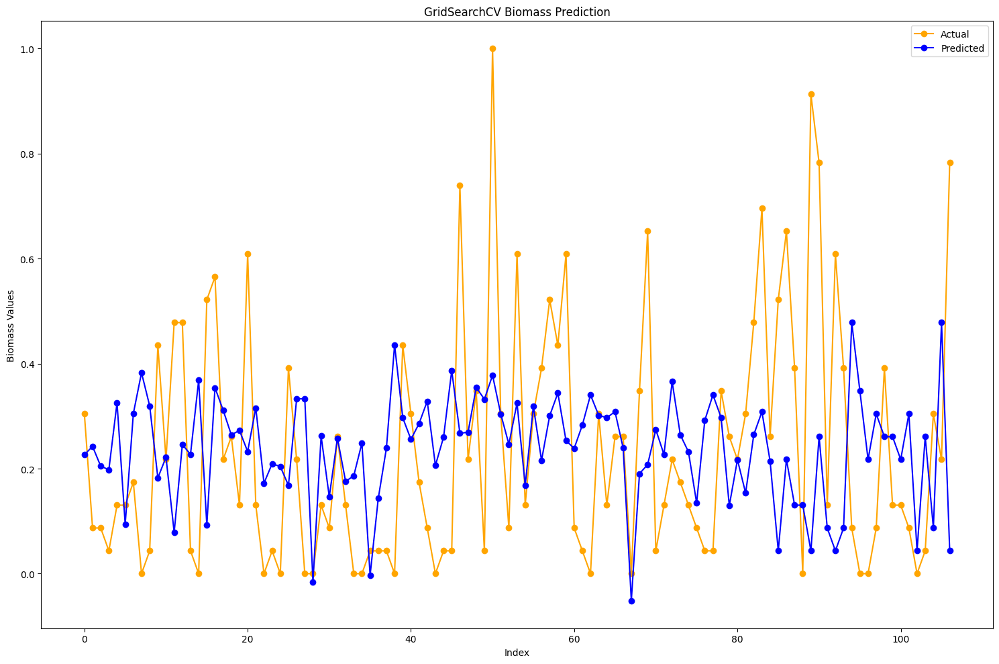

elastic R2 Score: 0.3120
elastic R2 Score: 0.3120
elastic MSE: 0.0120
elastic RMSE: 0.1097
elastic MAE: 0.0862


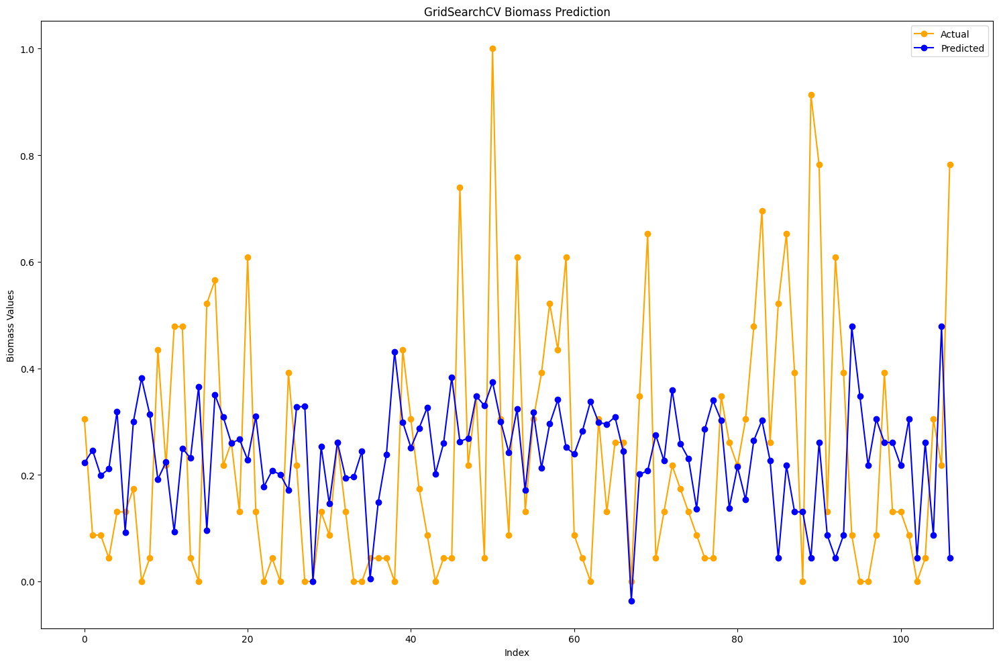

dt R2 Score: -1.8475
dt R2 Score: -1.8475
dt MSE: 0.0498
dt RMSE: 0.2231
dt MAE: 0.1836


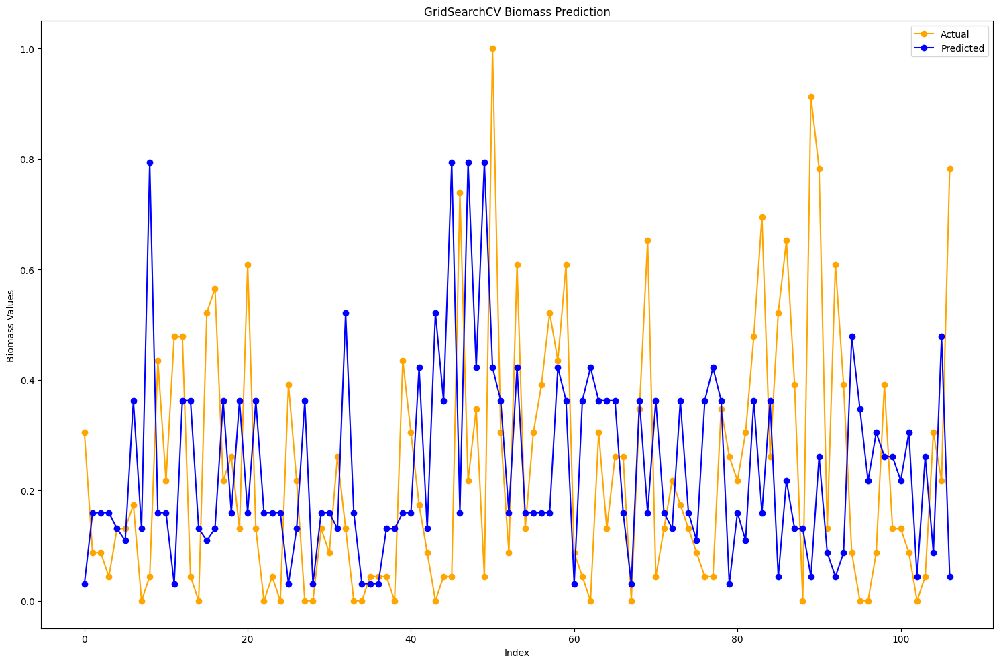

rf R2 Score: -1.0441
rf R2 Score: -1.0441
rf MSE: 0.0357
rf RMSE: 0.1890
rf MAE: 0.1485


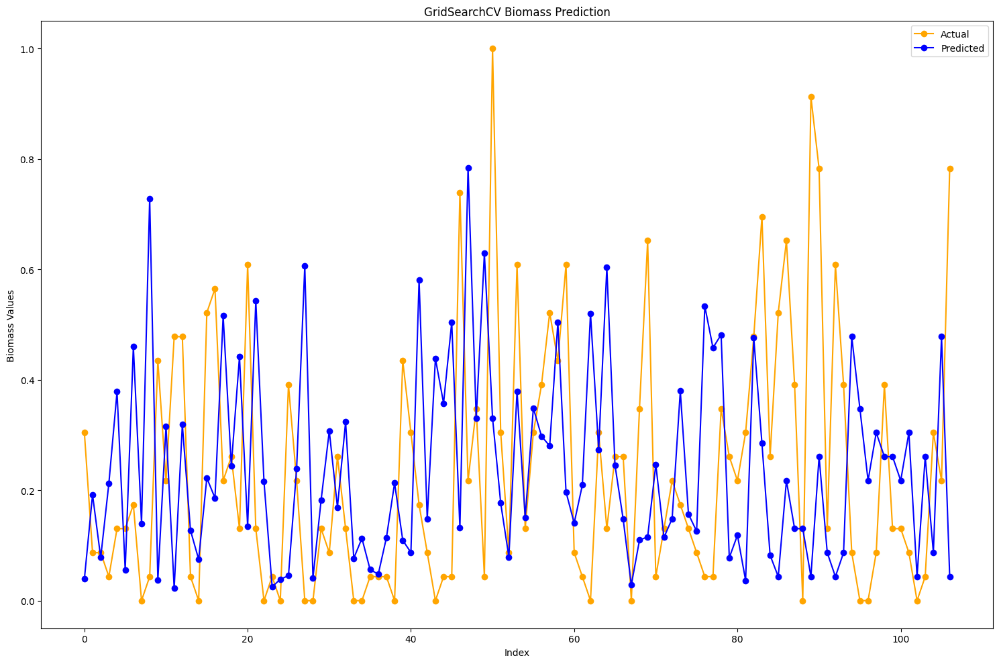

svr R2 Score: 0.0716
svr R2 Score: 0.0716
svr MSE: 0.0162
svr RMSE: 0.1274
svr MAE: 0.1004


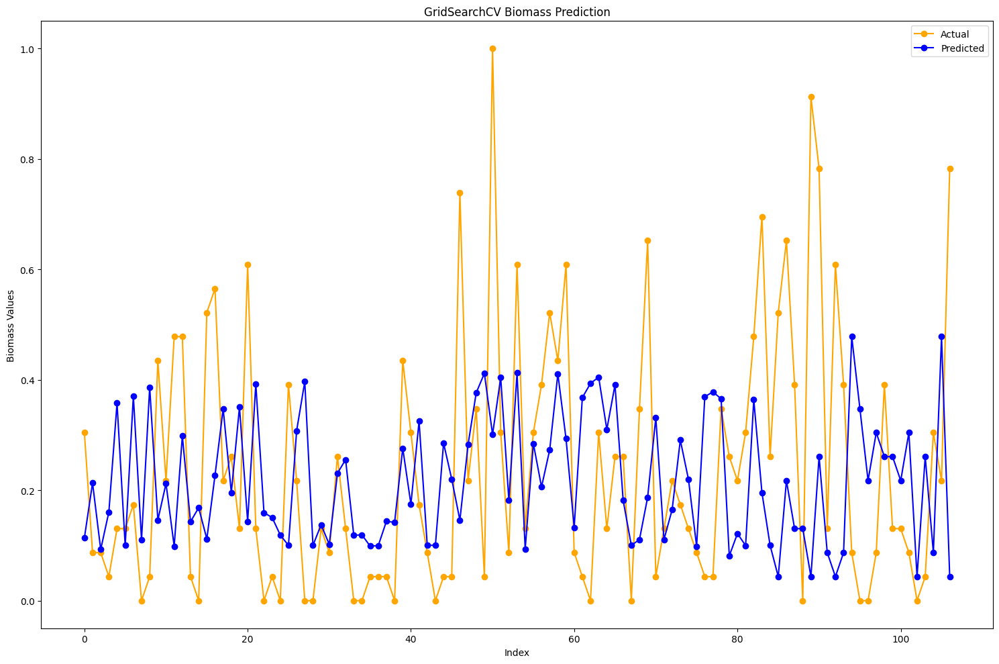

xgb R2 Score: -0.4180
xgb R2 Score: -0.4180
xgb MSE: 0.0248
xgb RMSE: 0.1574
xgb MAE: 0.1300


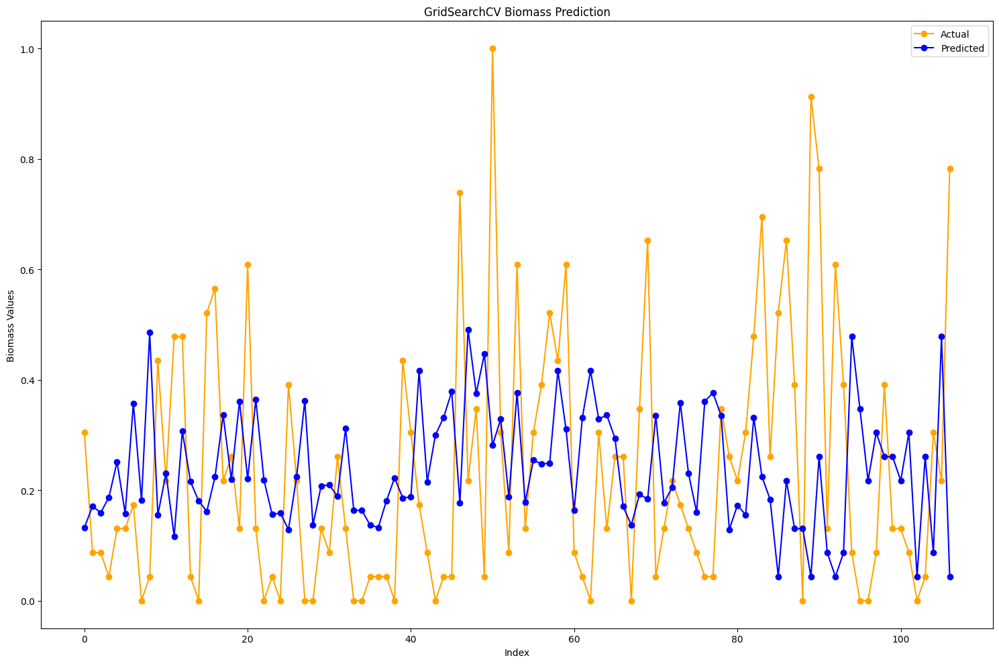

In [ ]:
print('PCA on Initial features')
best_models = {}
for name, (model, param_grid) in models.items():
    rs = GridSearchCV(model, param_grid, cv=5, n_jobs=-1)
    rs.fit(X_train_pca, y_train)
    best_models[name] = rs.best_estimator_
    y_pred = rs.predict(X_test_pca)
    print(f"{name} R2 Score: {r2_score(y_test, y_pred):.4f}")
    print(f"{name} R2 Score: {r2_score(y_test, y_pred):.4f}")
    print(f"{name} MSE: {mean_squared_error(y_test, y_pred):.4f}")
    print(f"{name} RMSE: {np.sqrt(mean_squared_error(y_test, y_pred)):.4f}")
    print(f"{name} MAE: {mean_absolute_error(y_test, y_pred):.4f}")
    plot_results(rs, carbon_df['biomass'], rs.predict(X_train_pca), y_test)
    # Save model
    joblib.dump(rs.best_estimator_, f'pca_initial_{name}_model.pkl')

Scaled Feature engineered features
lr R2 Score: -0.3314
lr R2 Score: -0.3314
lr MSE: 0.0245
lr RMSE: 0.1564
lr MAE: 0.1373


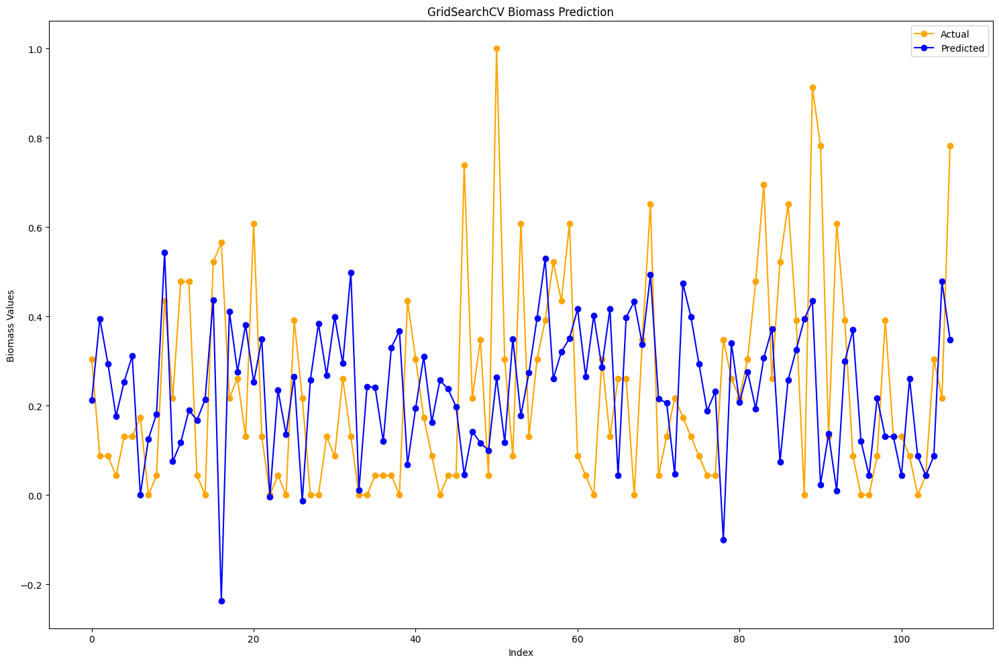

lasso R2 Score: 0.1507
lasso R2 Score: 0.1507
lasso MSE: 0.0156
lasso RMSE: 0.1249
lasso MAE: 0.0992


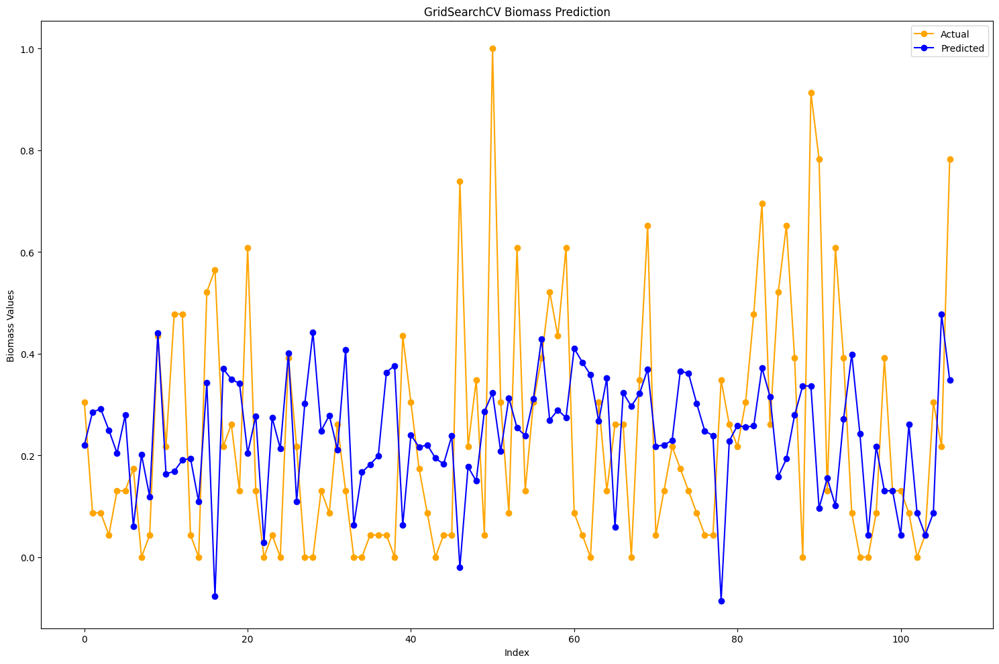

ridge R2 Score: 0.0967
ridge R2 Score: 0.0967
ridge MSE: 0.0166
ridge RMSE: 0.1288
ridge MAE: 0.1001


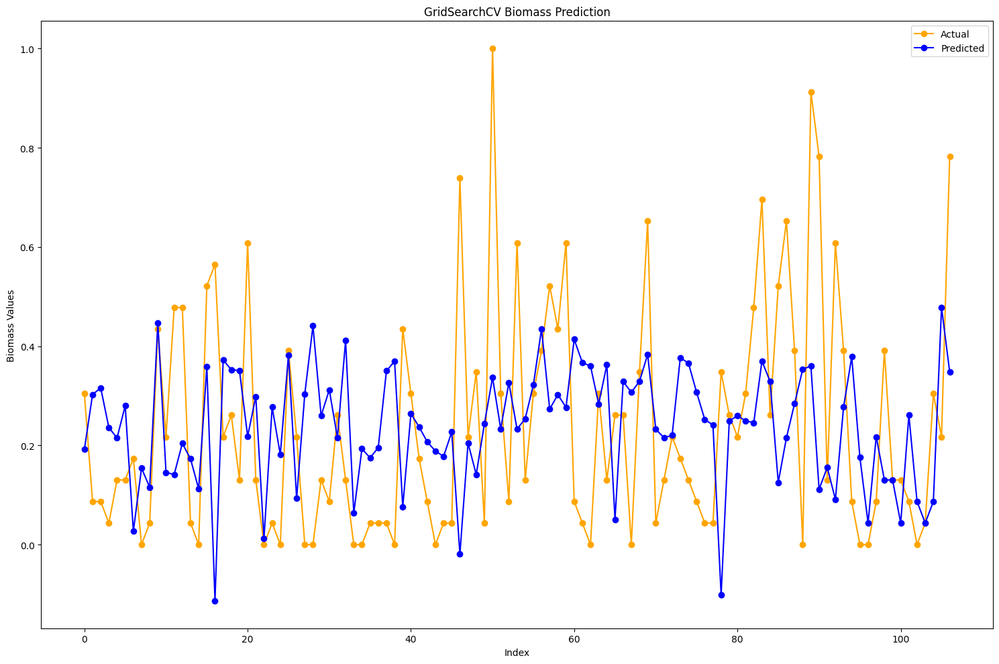

elastic R2 Score: 0.0369
elastic R2 Score: 0.0369
elastic MSE: 0.0177
elastic RMSE: 0.1330
elastic MAE: 0.1047


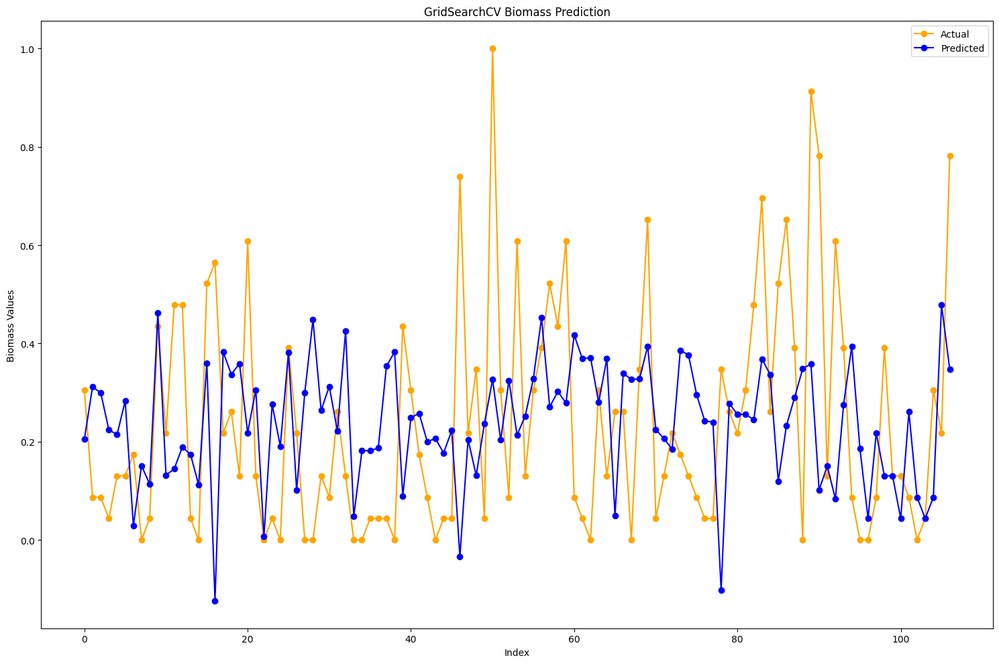

dt R2 Score: -1.4709
dt R2 Score: -1.4709
dt MSE: 0.0454
dt RMSE: 0.2131
dt MAE: 0.1457


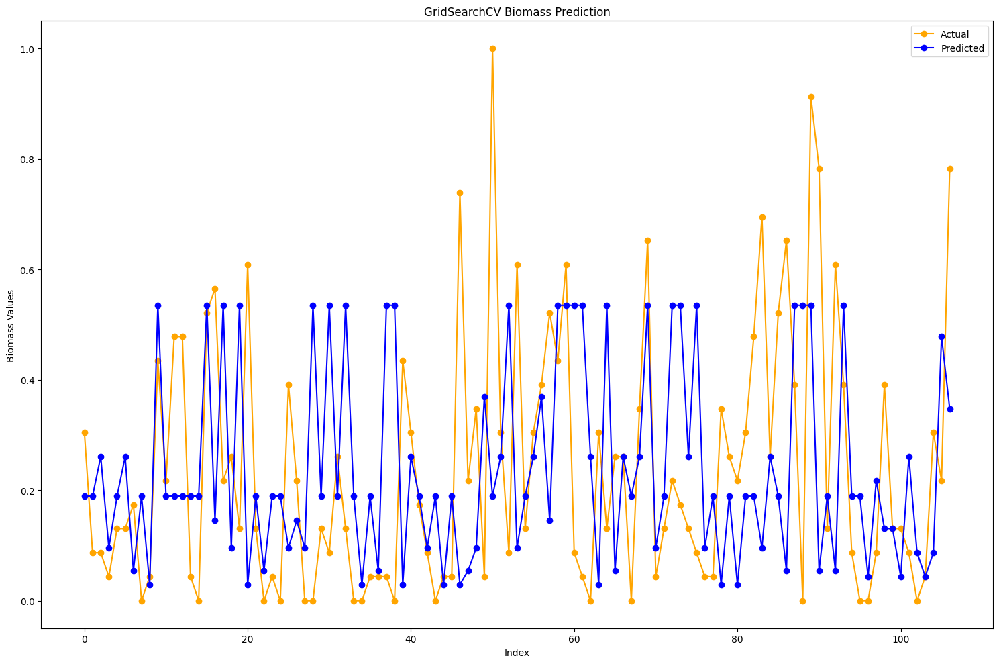

rf R2 Score: -0.9443
rf R2 Score: -0.9443
rf MSE: 0.0357
rf RMSE: 0.1890
rf MAE: 0.1314


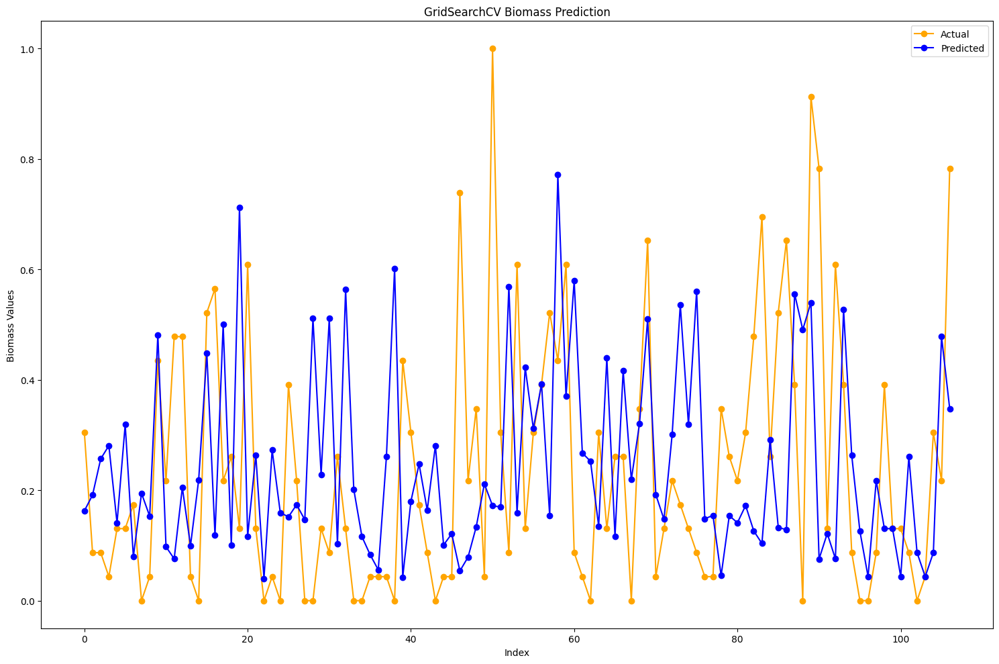

svr R2 Score: -0.6102
svr R2 Score: -0.6102
svr MSE: 0.0296
svr RMSE: 0.1720
svr MAE: 0.1225


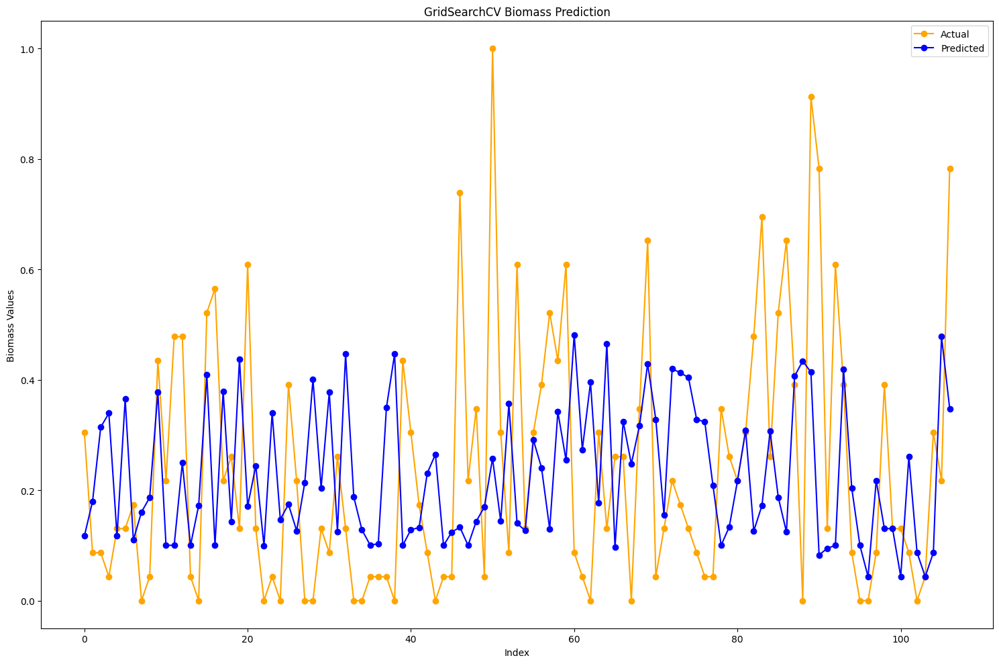

xgb R2 Score: -0.5227
xgb R2 Score: -0.5227
xgb MSE: 0.0280
xgb RMSE: 0.1673
xgb MAE: 0.1288


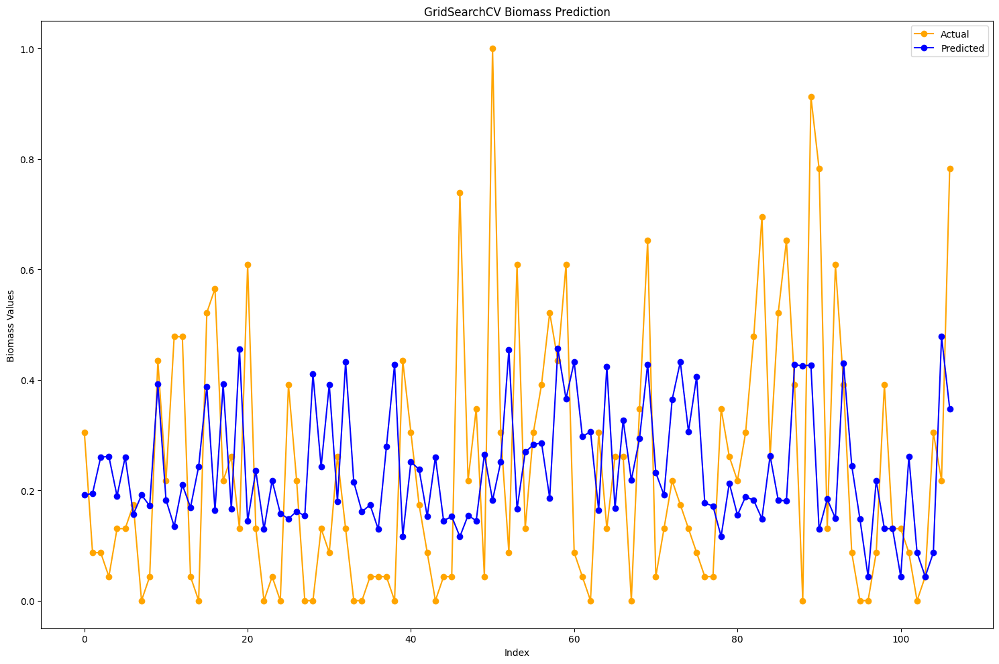

In [ ]:
print('Scaled Feature engineered features')
best_models = {}
for name, (model, param_grid) in models.items():
    rs = GridSearchCV(model, param_grid, cv=5, n_jobs=-1)
    rs.fit(fe_X_train_scaled, fe_y_train)
    best_models[name] = rs.best_estimator_
    y_pred = rs.predict(fe_X_test_scaled)
    print(f"{name} R2 Score: {r2_score(fe_y_test, y_pred):.4f}")
    print(f"{name} R2 Score: {r2_score(fe_y_test, y_pred):.4f}")
    print(f"{name} MSE: {mean_squared_error(fe_y_test, y_pred):.4f}")
    print(f"{name} RMSE: {np.sqrt(mean_squared_error(fe_y_test, y_pred)):.4f}")
    print(f"{name} MAE: {mean_absolute_error(fe_y_test, y_pred):.4f}")
    plot_results(rs, df['biomass'], rs.predict(fe_X_train_scaled), fe_y_test)
    # Save model
    joblib.dump(rs.best_estimator_, f'scaled_fe_{name}_model.pkl')

PCA on Feature engineered features
lr R2 Score: 0.1892
lr R2 Score: 0.1892
lr MSE: 0.0149
lr RMSE: 0.1221
lr MAE: 0.1051


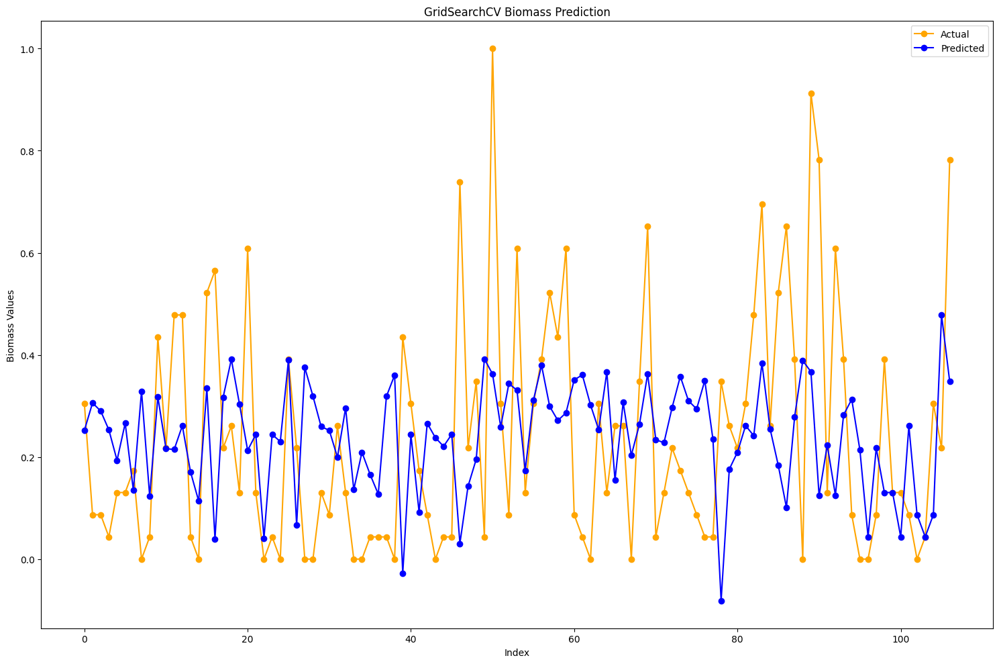

lasso R2 Score: 0.1694
lasso R2 Score: 0.1694
lasso MSE: 0.0153
lasso RMSE: 0.1235
lasso MAE: 0.1070


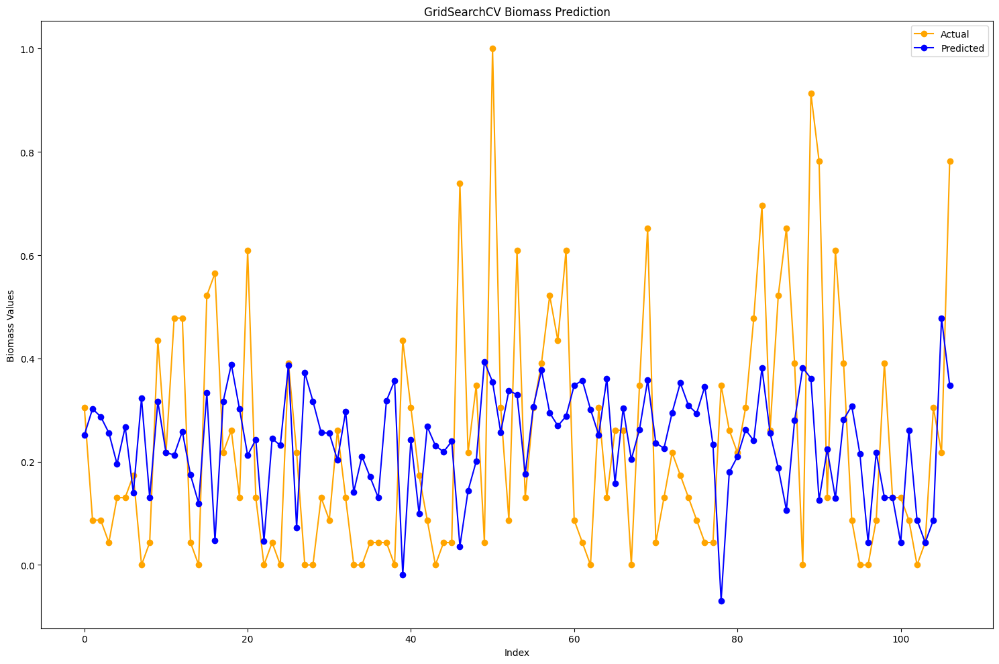

ridge R2 Score: 0.1451
ridge R2 Score: 0.1451
ridge MSE: 0.0157
ridge RMSE: 0.1253
ridge MAE: 0.1091


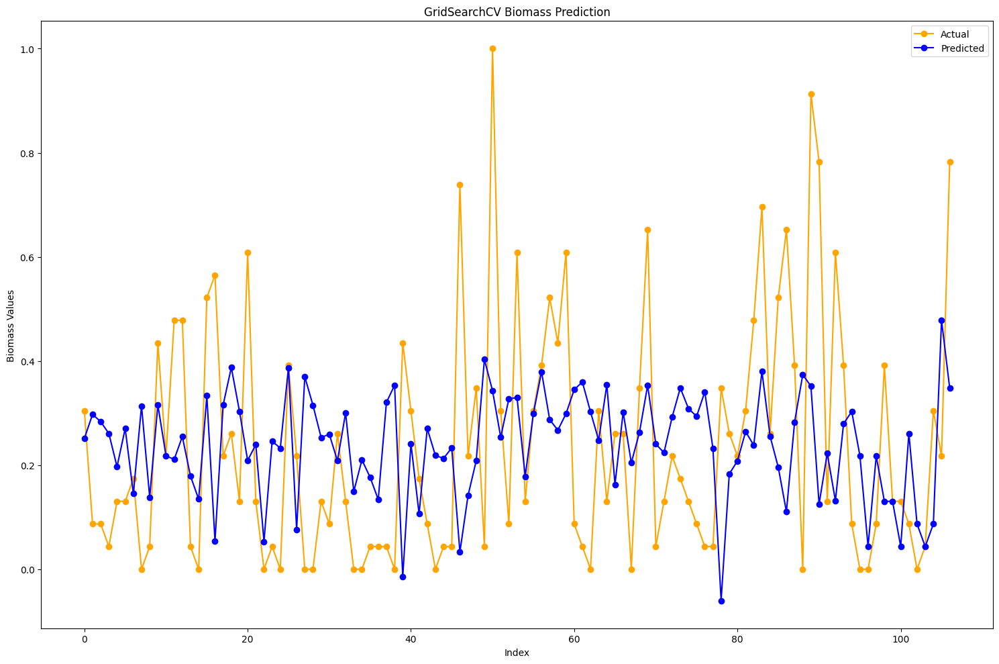

elastic R2 Score: 0.1569
elastic R2 Score: 0.1569
elastic MSE: 0.0155
elastic RMSE: 0.1245
elastic MAE: 0.1082


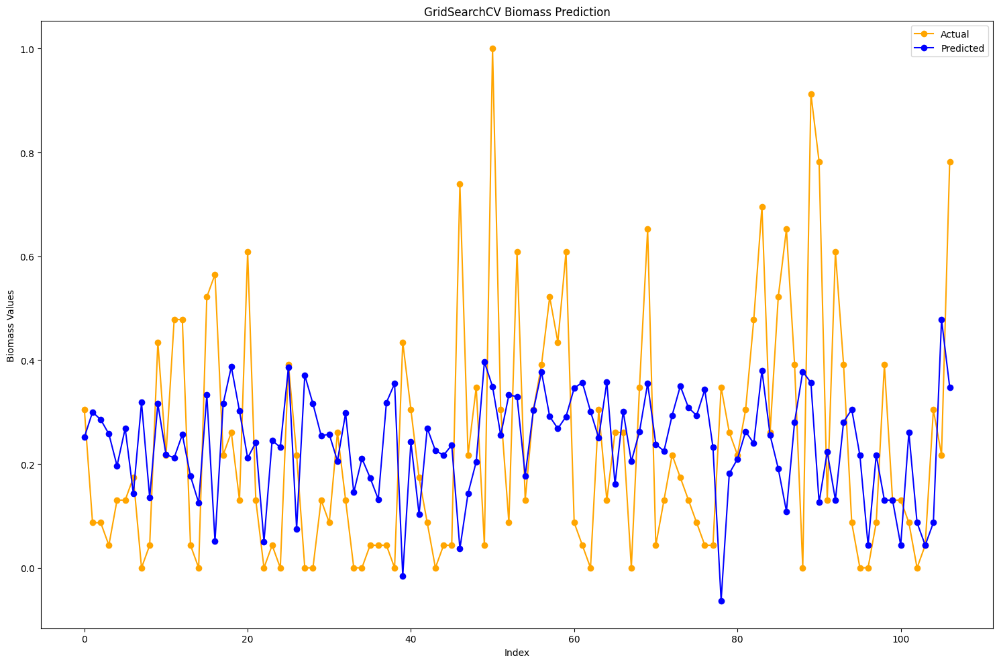

dt R2 Score: -1.1306
dt R2 Score: -1.1306
dt MSE: 0.0391
dt RMSE: 0.1978
dt MAE: 0.1583


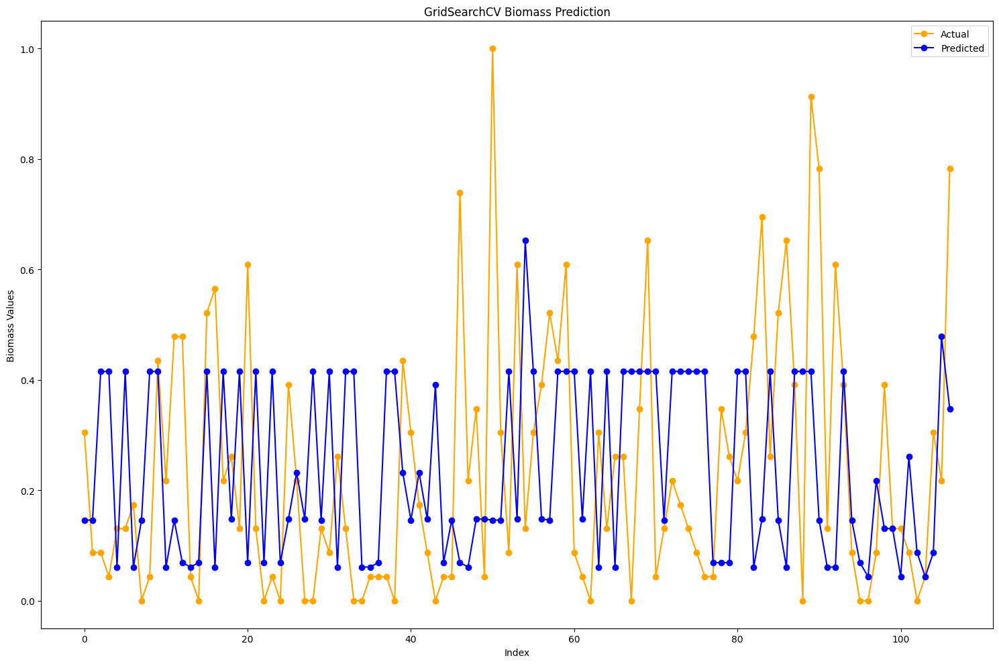

rf R2 Score: -1.4103
rf R2 Score: -1.4103
rf MSE: 0.0443
rf RMSE: 0.2104
rf MAE: 0.1631


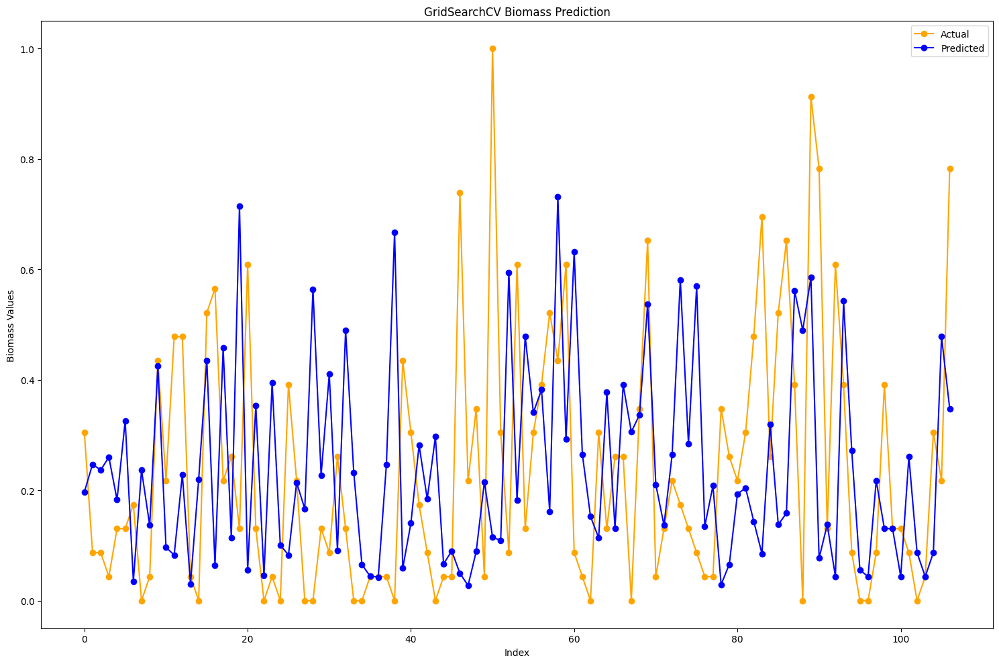

svr R2 Score: -0.5933
svr R2 Score: -0.5933
svr MSE: 0.0293
svr RMSE: 0.1711
svr MAE: 0.1235


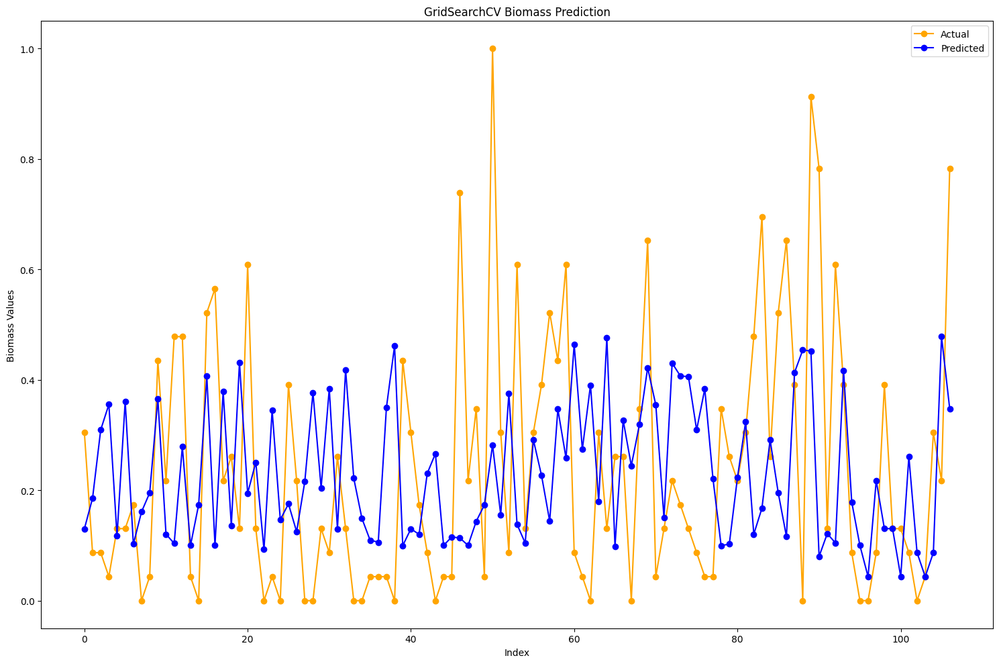

xgb R2 Score: -0.7326
xgb R2 Score: -0.7326
xgb MSE: 0.0318
xgb RMSE: 0.1784
xgb MAE: 0.1457


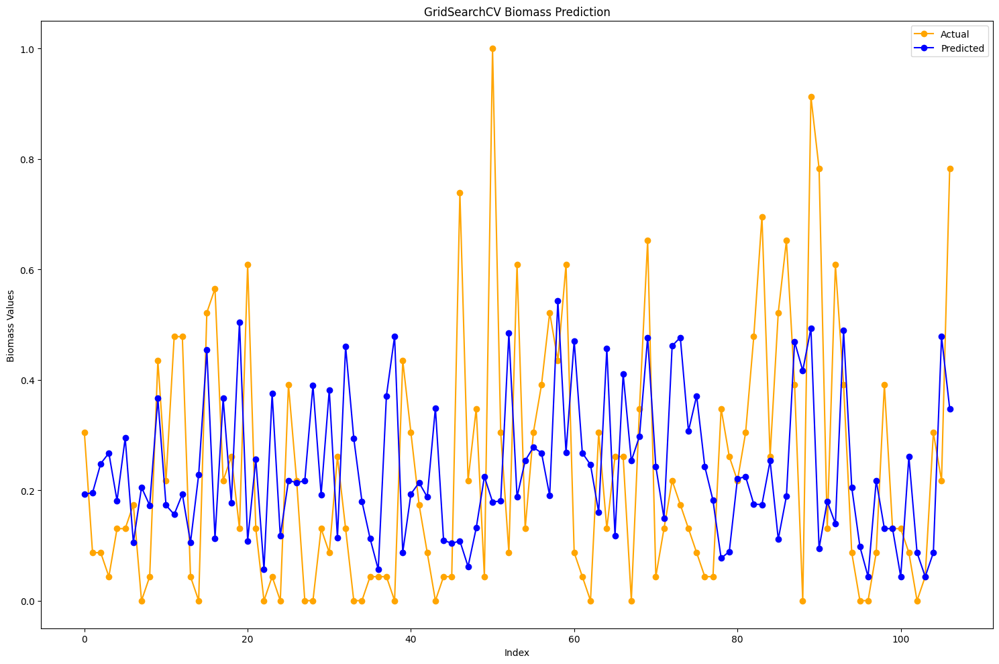

In [ ]:
print('PCA on Feature engineered features')
best_models = {}
for name, (model, param_grid) in models.items():
    rs = GridSearchCV(model, param_grid, cv=5, n_jobs=-1)
    rs.fit(fe_X_train_pca, fe_y_train)
    best_models[name] = rs.best_estimator_
    y_pred = rs.predict(fe_X_test_pca)
    print(f"{name} R2 Score: {r2_score(fe_y_test, y_pred):.4f}")
    print(f"{name} R2 Score: {r2_score(fe_y_test, y_pred):.4f}")
    print(f"{name} MSE: {mean_squared_error(fe_y_test, y_pred):.4f}")
    print(f"{name} RMSE: {np.sqrt(mean_squared_error(fe_y_test, y_pred)):.4f}")
    print(f"{name} MAE: {mean_absolute_error(fe_y_test, y_pred):.4f}")
    plot_results(rs, df['biomass'], rs.predict(fe_X_train_pca), fe_y_test)
    # Save model
    joblib.dump(rs.best_estimator_, f'pca_fe_{name}_model.pkl')

## **Neural Network**

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
# Define the model architecture with dropout for regularization
def nn_train(df, X_train, X_test, y_train, y_test):
  model = keras.Sequential([
      layers.Dense(64, activation='relu', input_shape=(X_train.shape[1],)),
      layers.Dropout(0.3),
      layers.Dense(32, activation='relu'),
      layers.Dense(1)
  ])

  model.compile(optimizer='adam',
                loss='mae',
                metrics=['mse', tf.keras.metrics.RootMeanSquaredError(), tf.keras.metrics.R2Score()])
  # plot model's architecture
  tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

  history = model.fit(X_train, y_train, epochs=100, batch_size=16, validation_split=0.1)

  # Evaluate the model
  loss, mae, rmse, r2 = model.evaluate(X_test, y_test)
  print(f"Test Loss: {loss:.4f}")
  print(f"Test MAE: {mae:.4f}")
  print(f"Test RMSE: {rmse:.4f}")
  print(f"Test R-squared: {r2:.4f}")

  # Make predictions
  y_pred_nn = model.predict(X_test)

  # Plot the results for the neural network
  plot_results(model, df['biomass'], model.predict(X_train), y_pred_nn)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 123ms/step - loss: 0.3007 - mse: 0.1647 - r2_score: -1.5689 - root_mean_squared_error: 0.4052 - val_loss: 0.2682 - val_mse: 0.1059 - val_r2_score: -0.5960 - val_root_mean_squared_error: 0.3255
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.2916 - mse: 0.1489 - r2_score: -1.2652 - root_mean_squared_error: 0.3856 - val_loss: 0.2262 - val_mse: 0.0712 - val_r2_score: -0.0725 - val_root_mean_squared_error: 0.2668
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.2671 - mse: 0.1253 - r2_score: -0.9949 - root_mean_squared_error: 0.3540 - val_loss: 0.1893 - val_mse: 0.0502 - val_r2_score: 0.2429 - val_root_mean_squared_error: 0.2242
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.2515 - mse: 0.1123 - r2_score: -1.0600 - root_mean_squared_error: 0.3351 - val_loss: 0.1846 - val_mse: 0.0540 - val_r2_score: 0.1866 - val_root_mean_squared_error: 0.2323
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 0.2353 - mse: 0

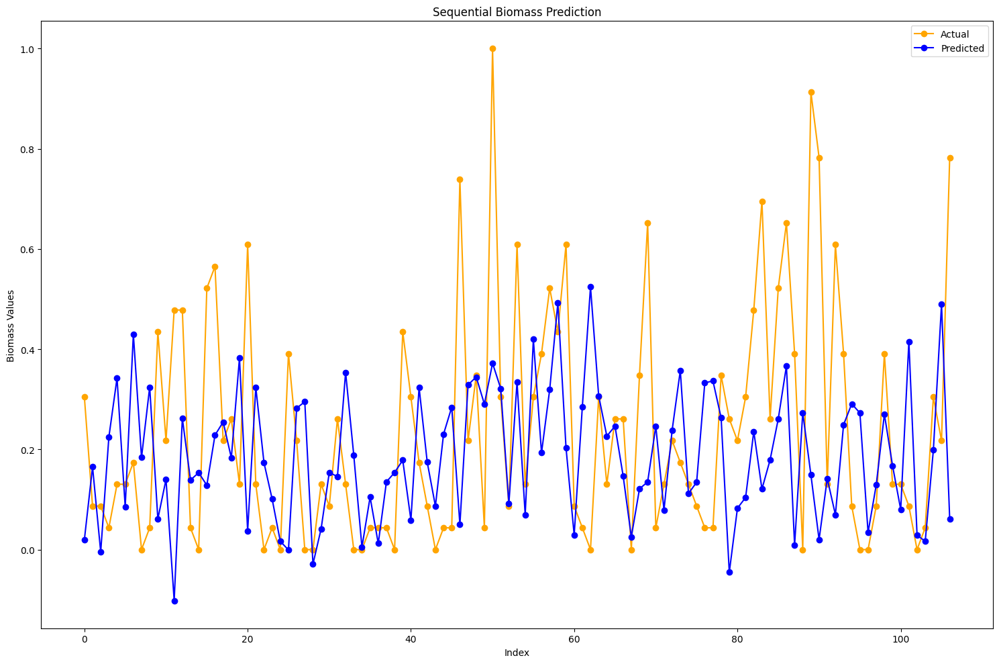

In [ ]:
nn_train(carbon_df, X_train_pca,X_test_pca, y_train, y_test)

Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - loss: 0.3963 - mse: 0.2179 - r2_score: -3.3218 - root_mean_squared_error: 0.4652 - val_loss: 0.3627 - val_mse: 0.1533 - val_r2_score: -1.3093 - val_root_mean_squared_error: 0.3915
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3158 - mse: 0.1687 - r2_score: -2.0842 - root_mean_squared_error: 0.4104 - val_loss: 0.2750 - val_mse: 0.1045 - val_r2_score: -0.5749 - val_root_mean_squared_error: 0.3233
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.2445 - mse: 0.1363 - r2_score: -1.5166 - root_mean_squared_error: 0.3644 - val_loss: 0.2807 - val_mse: 0.1077 - val_r2_score: -0.6220 - val_root_mean_squared_error: 0.3281
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.2807 - mse: 0.1544 - r2_score: -1.7391 - root_mean_squared_error: 0.3926 - val_loss: 0.2696 - val_mse: 0.0980 - val_r2_score: -0.4771 - val_root_mean_squared_error: 0.3131
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.2286 - mse: 0.0903 - r2_

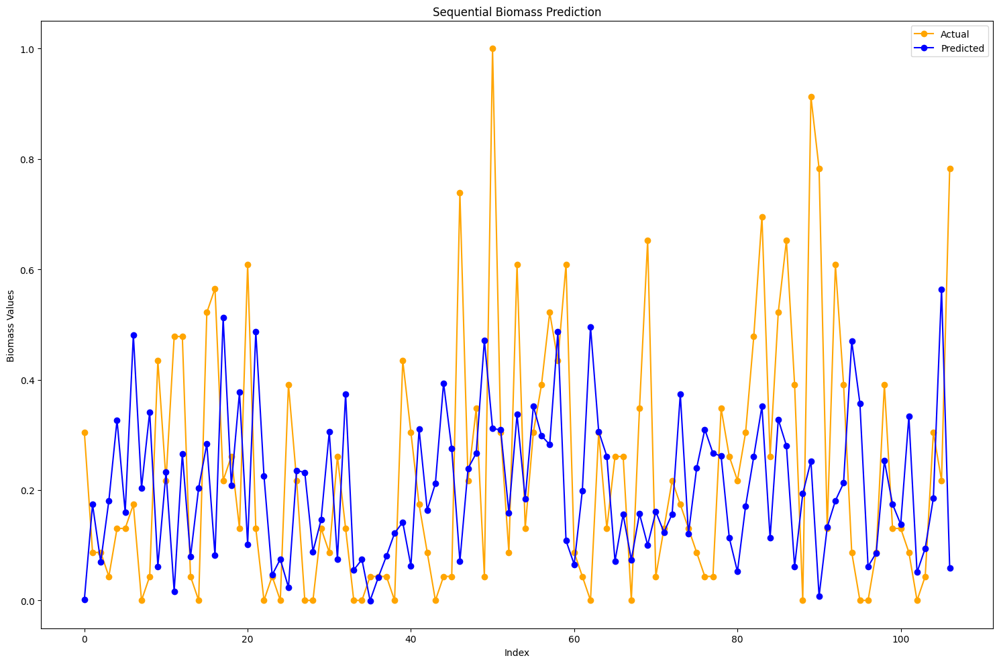

In [ ]:
nn_train(carbon_df, X_train_scaled, X_test_scaled, y_train, y_test)

Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.3641 - mse: 0.2432 - r2_score: -3.5064 - root_mean_squared_error: 0.4917 - val_loss: 0.2955 - val_mse: 0.1299 - val_r2_score: -1.0646 - val_root_mean_squared_error: 0.3605
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3197 - mse: 0.1690 - r2_score: -2.2840 - root_mean_squared_error: 0.4109 - val_loss: 0.2420 - val_mse: 0.0868 - val_r2_score: -0.3797 - val_root_mean_squared_error: 0.2947
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3203 - mse: 0.1808 - r2_score: -1.9695 - root_mean_squared_error: 0.4241 - val_loss: 0.2133 - val_mse: 0.0697 - val_r2_score: -0.1082 - val_root_mean_squared_error: 0.2641
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.3172 - mse: 0.1562 - r2_score: -1.4839 - root_mean_squared_error: 0.3949 - val_loss: 0.2093 - val_mse: 0.0709 - val_r2_score: -0.1274 - val_root_mean_squared_error: 0.2664
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.2557 - mse: 0.1085 - r2_

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


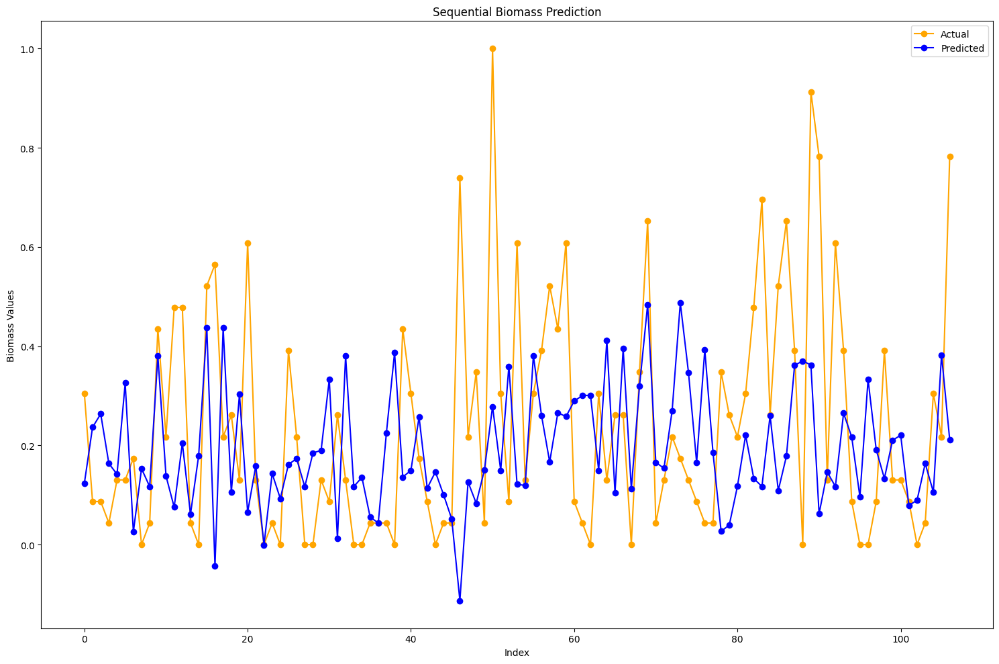

In [ ]:
nn_train(df, fe_X_train_pca, fe_X_test_pca, fe_y_train, fe_y_test)

Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step - loss: 0.3310 - mse: 0.2617 - r2_score: -4.2593 - root_mean_squared_error: 0.5088 - val_loss: 0.3287 - val_mse: 0.1596 - val_r2_score: -1.5356 - val_root_mean_squared_error: 0.3995
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3119 - mse: 0.1836 - r2_score: -2.2890 - root_mean_squared_error: 0.4249 - val_loss: 0.3191 - val_mse: 0.1347 - val_r2_score: -1.1406 - val_root_mean_squared_error: 0.3670
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.2940 - mse: 0.1428 - r2_score: -2.0458 - root_mean_squared_error: 0.3771 - val_loss: 0.2681 - val_mse: 0.1022 - val_r2_score: -0.6246 - val_root_mean_squared_error: 0.3197
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.2428 - mse: 0.1264 - r2_score: -1.1840 - root_mean_squared_error: 0.3547 - val_loss: 0.2158 - val_mse: 0.0655 - val_r2_score: -0.0401 - val_root_mean_squared_error: 0.2558
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.2281 - mse: 0.0888 - r2_

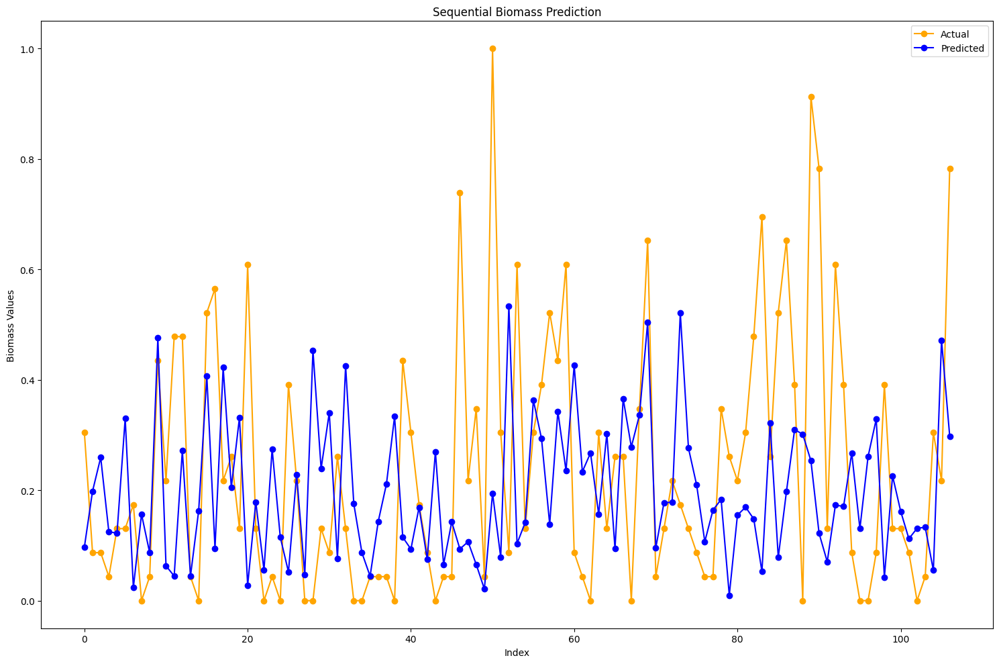

In [ ]:
nn_train(df, fe_X_train_scaled, fe_X_test_scaled, fe_y_train, fe_y_test)